# Installazione dei pacchetti

In [1]:
%pip install kagglehub
%pip install pandas
%pip install -U jupyter ipywidgets
%pip install -U jupyterlab-widgets
%pip install seaborn
%pip install scikit-learn
%pip install imbalanced-learn
%pip install xgboost

Defaulting to user installation because normal site-packages is not writeable
Note: you may need to restart the kernel to use updated packages.
Defaulting to user installation because normal site-packages is not writeable
Note: you may need to restart the kernel to use updated packages.
Defaulting to user installation because normal site-packages is not writeable
Note: you may need to restart the kernel to use updated packages.
Defaulting to user installation because normal site-packages is not writeable
Note: you may need to restart the kernel to use updated packages.
Defaulting to user installation because normal site-packages is not writeableNote: you may need to restart the kernel to use updated packages.

Defaulting to user installation because normal site-packages is not writeable
Note: you may need to restart the kernel to use updated packages.
Defaulting to user installation because normal site-packages is not writeable
Note: you may need to restart the kernel to use updated pa

# Importazione del dataset

In [2]:
import kagglehub
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import os
import warnings
import math
from sklearn.decomposition import PCA
from sklearn.preprocessing import MinMaxScaler
from imblearn.over_sampling import SMOTE
from sklearn.model_selection import train_test_split, KFold
from sklearn.model_selection import GridSearchCV
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import RandomForestClassifier
from xgboost import XGBClassifier
from sklearn.svm import SVC
from sklearn.ensemble import StackingClassifier
from sklearn.svm import SVR
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from sklearn.metrics import roc_curve, auc
from sklearn.metrics import silhouette_score, calinski_harabasz_score, davies_bouldin_score
from sklearn.datasets import make_blobs
from sklearn.cluster import KMeans
from sklearn.neighbors import NearestNeighbors
from sklearn.cluster import DBSCAN
warnings.filterwarnings("ignore")

# Download latest version
path = kagglehub.dataset_download("fedesoriano/company-bankruptcy-prediction")
file_path = os.path.join(path, "data.csv")

df = pd.read_csv(file_path)

df = df.rename(columns={
    'Bankrupt?': 'bankrupt'
})

df['bankrupt'] = df['bankrupt'].astype(bool)

print(f"Numero di righe nel dataset: {df.shape[0]}")

df.head()

Numero di righe nel dataset: 6819


,bankrupt,ROA(C) before interest and depreciation before interest,ROA(A) before interest and % after tax,ROA(B) before interest and depreciation after tax,Operating Gross Margin,Realized Sales Gross Margin,Operating Profit Rate,Pre-tax net Interest Rate,After-tax net Interest Rate,Non-industry income and expenditure/revenue,...,Net Income to Total Assets,Total assets to GNP price,No-credit Interval,Gross Profit to Sales,Net Income to Stockholder's Equity,Liability to Equity,Degree of Financial Leverage (DFL),Interest Coverage Ratio (Interest expense to EBIT),Net Income Flag,Equity to Liability
0,True,0.370594,0.424389,0.405750,0.601457,0.601457,0.998969,0.796887,0.808809,0.302646,...,0.716845,0.009219,0.622879,0.601453,0.827890,0.290202,0.026601,0.564050,1,0.016469
1,True,0.464291,0.538214,0.516730,0.610235,0.610235,0.998946,0.797380,0.809301,0.303556,...,0.795297,0.008323,0.623652,0.610237,0.839969,0.283846,0.264577,0.570175,1,0.020794
2,True,0.426071,0.499019,0.472295,0.601450,0.601364,0.998857,0.796403,0.808388,0.302035,...,0.774670,0.040003,0.623841,0.601449,0.836774,0.290189,0.026555,0.563706,1,0.016474
3,True,0.399844,0.451265,0.457733,0.583541,0.583541,0.998700,0.796967,0.808966,0.303350,...,0.739555,0.003252,0.622929,0.583538,0.834697,0.281721,0.026697,0.564663,1,0.023982
4,True,0.465022,0.538432,0.522298,0.598783,0.598783,0.998973,0.797366,0.809304,0.303475,...,0.795016,0.003878,0.623521,0.598782,0.839973,0.278514,0.024752,0.575617,1,0.035490


# Analisi descrittiva

In [2]:
# Dimensione del dataset
print(f"Numero di righe: {df.shape[0]}")
print(f"Numero di colonne: {df.shape[1]}")

# Tipi di dati
print("\nTipi di dati:")
print(df.dtypes)

# Valori mancanti
print("\nValori mancanti per colonna:")
print(df.isnull().sum())

Numero di righe: 6819
Numero di colonne: 96

Tipi di dati:
bankrupt                                                       bool
 ROA(C) before interest and depreciation before interest    float64
 ROA(A) before interest and % after tax                     float64
 ROA(B) before interest and depreciation after tax          float64
 Operating Gross Margin                                     float64
                                                             ...   
 Liability to Equity                                        float64
 Degree of Financial Leverage (DFL)                         float64
 Interest Coverage Ratio (Interest expense to EBIT)         float64
 Net Income Flag                                              int64
 Equity to Liability                                        float64
Length: 96, dtype: object

Valori mancanti per colonna:
bankrupt                                                    0
 ROA(C) before interest and depreciation before interest    0
 ROA(A) befor

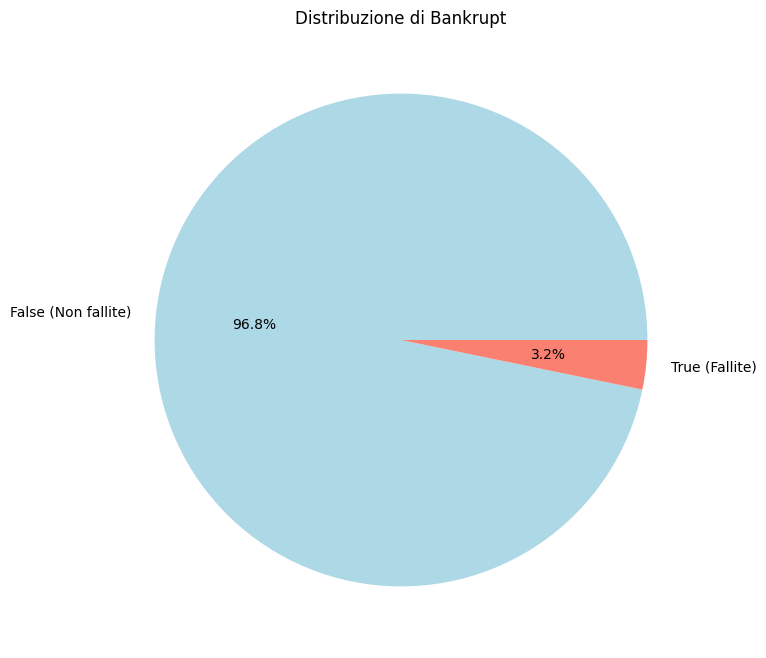


Statistiche descrittive:


,ROA(C) before interest and depreciation before interest,ROA(A) before interest and % after tax,ROA(B) before interest and depreciation after tax,Operating Gross Margin,Realized Sales Gross Margin,Operating Profit Rate,Pre-tax net Interest Rate,After-tax net Interest Rate,Non-industry income and expenditure/revenue,Continuous interest rate (after tax),...,Net Income to Total Assets,Total assets to GNP price,No-credit Interval,Gross Profit to Sales,Net Income to Stockholder's Equity,Liability to Equity,Degree of Financial Leverage (DFL),Interest Coverage Ratio (Interest expense to EBIT),Net Income Flag,Equity to Liability
count,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,...,6819.000000,6.819000e+03,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6819.0,6819.000000
mean,0.505180,0.558625,0.553589,0.607948,0.607929,0.998755,0.797190,0.809084,0.303623,0.781381,...,0.807760,1.862942e+07,0.623915,0.607946,0.840402,0.280365,0.027541,0.565358,1.0,0.047578
std,0.060686,0.065620,0.061595,0.016934,0.016916,0.013010,0.012869,0.013601,0.011163,0.012679,...,0.040332,3.764501e+08,0.012290,0.016934,0.014523,0.014463,0.015668,0.013214,0.0,0.050014
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000e+00,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.0,0.000000
25%,0.476527,0.535543,0.527277,0.600445,0.600434,0.998969,0.797386,0.809312,0.303466,0.781567,...,0.796750,9.036205e-04,0.623636,0.600443,0.840115,0.276944,0.026791,0.565158,1.0,0.024477
50%,0.502706,0.559802,0.552278,0.605997,0.605976,0.999022,0.797464,0.809375,0.303525,0.781635,...,0.810619,2.085213e-03,0.623879,0.605998,0.841179,0.278778,0.026808,0.565252,1.0,0.033798
75%,0.535563,0.589157,0.584105,0.613914,0.613842,0.999095,0.797579,0.809469,0.303585,0.781735,...,0.826455,5.269777e-03,0.624168,0.613913,0.842357,0.281449,0.026913,0.565725,1.0,0.052838
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,...,1.000000,9.820000e+09,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.0,1.000000


In [4]:
# Distribuzione di 'bankrupt' (variabile categorica)
bankrupt_counts = df['bankrupt'].value_counts()

# Creazione del grafico a torta
plt.figure(figsize=(8, 8))
bankrupt_counts.plot.pie(autopct='%1.1f%%', labels=['False (Non fallite)', 'True (Fallite)'], colors=['lightblue', 'salmon'])
plt.title('Distribuzione di Bankrupt')
plt.ylabel('')  # Rimuove etichetta asse y
plt.show()

# Statistiche descrittive per variabili numeriche
print("\nStatistiche descrittive:")
df.describe()
# mean -> media
# std -> deviazione standard
# min -> minimo
# 25% -> primo quartile
# 50% -> mediana
# 75% -> terzo quartile
# max -> massimo

### Analisi grafica
Ogni grafico mostra la distribuzione dei valori della variabile corrispondente.
L'asse <tt>`x`</tt> rappresenta i valori della variabile, mentre l'asse <tt>`y`</tt> rappresenta la frequenza.
La <tt>`KDE`</tt> (Kernel Density Estimate), la curva sovrapposta, rappresenta la stima della densità della distribuzione ed è utile per identificare il tipo di distribuzione (es. normale, asimmetrica, multimodale).
In particolare:
- Le **distribuzioni normali** sono le variabili che seguono un andamento a campana;
- Le **asimmetrie** sono variabili con code lunghe su un lato, indicando _skewness_ (asimmetria);
- Le **multimodalità** sono variabili con più picchi, che potrebbero suggerire cluster distinti;
- Gli **outlier** sono picchi o valori isolati lontani dalla distribuzione principale.

In [ ]:
numerical_cols = df.select_dtypes(include=['float64', 'int64']).columns

# Calcolo dinamico del numero di righe e colonne
n_cols = 4  # Numero di colonne della griglia
n_rows = math.ceil(len(numerical_cols) / n_cols)  # Numero di righe necessario

# Creazione della figura con dimensioni proporzionate
plt.figure(figsize=(15, 5 * n_rows))
for i, col in enumerate(numerical_cols):
    plt.subplot(n_rows, n_cols, i + 1)  # Generazione del subplot
    sns.histplot(df[col], kde=True, bins=30)  # Istogramma con kde
    plt.title(f"{col}", fontsize=10)  # Titolo del grafico
plt.tight_layout(pad=3)  # Spaziatura ottimizzata
plt.show()

## Relazioni tra le variabili
Ogni box rappresenta la distribuzione dei valori della variabile numerica per una delle due categorie del target (<tt>`True`</tt> o <tt>`False`</tt>).
In particolare:
- La lunghezza del box indica l’intervallo interquartile (IQR, dal 25° al 75° percentile);
- La linea all’interno del box rappresenta la mediana;
- I punti esterni possono rappresentare outlier.

Per l'interpretazione dei grafici:
- Se i box per <tt>`True`</tt> e <tt>`False`</tt> sono molto simili (stessa altezza, posizione, e larghezza), la variabile **non è discriminante**.
- Se i box sono ben separati (con valori mediani distanti e poca sovrapposizione), la variabile è un **buon predittore**.

In [ ]:
# Numero di variabili per figura
variables_per_plot = 4
num_plots = math.ceil(len(numerical_cols) / variables_per_plot)

# Scatter plot con 5 variabili per figura
target_col = 'bankrupt'

for i in range(num_plots):
    # Creazione di una figura
    fig, axes = plt.subplots(1, variables_per_plot, figsize=(20, 5), constrained_layout=True)
    
    # Selezione delle colonne da visualizzare in questo gruppo
    cols_to_plot = numerical_cols[i * variables_per_plot:(i + 1) * variables_per_plot]
    
    for j, col in enumerate(cols_to_plot):
        sns.boxplot(ax=axes[j], x=df[target_col], y=df[col])
        axes[j].set_title(f"{col} e {target_col}")
        axes[j].set_xlabel(target_col)
        axes[j].set_ylabel(col)
    
    # Nasconde assi vuoti (se il numero di colonne non è multiplo di 4)
    for j in range(len(cols_to_plot), variables_per_plot):
        fig.delaxes(axes[j])

    plt.show()

## Identificazione degli outlier (valori anomali)
Identificazione degli outlier tramite metodo **IQR (Interquartile Range)**.
Gli outlier si trovano al di fuori di: <tt>`[Q1−1.5⋅IQR, Q3+1.5⋅IQR]`</tt>, dove <tt>`𝐼𝑄𝑅=𝑄3−𝑄1`</tt>

In [ ]:
outliers_dict = {}

# Itera su tutte le colonne numeriche
for col in df.select_dtypes(include=['float64', 'int64']).columns:
    Q1 = df[col].quantile(0.25) # Primo quartile
    Q3 = df[col].quantile(0.75) # Terzo quartile
    IQR = Q3 - Q1 # Intervallo interquartile
    lower_limit = Q1 - 1.5 * IQR
    upper_limit = Q3 + 1.5 * IQR
    
    # Trova gli outlier per questa colonna
    outliers = df[(df[col] < lower_limit) | (df[col] > upper_limit)] 
    outliers_dict[col] = outliers.index.tolist()  # Salva gli indici degli outlier
    
    print(f"Colonna: {col}, Numero di outlier: {len(outliers)}")

all_outliers = set([idx for indices in outliers_dict.values() for idx in indices])
print(f"Numero totale di outlier: {len(all_outliers)}")

Colonna:  ROA(C) before interest and depreciation before interest, Numero di outlier: 391
Colonna:  ROA(A) before interest and % after tax, Numero di outlier: 561
Colonna:  ROA(B) before interest and depreciation after tax, Numero di outlier: 432
Colonna:  Operating Gross Margin, Numero di outlier: 320
Colonna:  Realized Sales Gross Margin, Numero di outlier: 318
Colonna:  Operating Profit Rate, Numero di outlier: 716
Colonna:  Pre-tax net Interest Rate, Numero di outlier: 773
Colonna:  After-tax net Interest Rate, Numero di outlier: 867
Colonna:  Non-industry income and expenditure/revenue, Numero di outlier: 1094
Colonna:  Continuous interest rate (after tax), Numero di outlier: 806
Colonna:  Operating Expense Rate, Numero di outlier: 0
Colonna:  Research and development expense rate, Numero di outlier: 182
Colonna:  Cash flow rate, Numero di outlier: 576
Colonna:  Interest-bearing debt interest rate, Numero di outlier: 396
Colonna:  Tax rate (A), Numero di outlier: 120
Colonna:  Net

In [ ]:
# Visualizzazione degli outlier
numeric_columns = df.select_dtypes(include=['float64', 'int64']).columns
columns_per_figure = 5

for i in range(0, len(numeric_columns), columns_per_figure):
    subset_columns = numeric_columns[i:i + columns_per_figure]
    
    # Crea la figura
    plt.figure(figsize=(15, 10))
    
    for j, col in enumerate(subset_columns, start=1):
        plt.subplot(len(subset_columns), 1, j)
        plt.title(f"Boxplot: {col}")
        df[col].plot(kind='box', vert=False)
    
    plt.tight_layout()
    plt.show() # Mostra la figura corrente prima di passare alla successiva

Dato che il dataset non è molto grande, abbiamo deciso di effettuare il **capping** degli outlier piuttosto che rimuoverli, in modo da mantenere intatto il dataset e da non perdere informazioni.
Il capping consiste nel "bloccare" i valori estremi in un intervallo definito, sostituendo i valori anomali con i limiti superiori o inferiori basati su una threshold (una soglia).

In [2]:
for col in df.select_dtypes(include=['float64', 'int64']).columns: # Itera su tutte le colonne numeriche
    Q1 = df[col].quantile(0.25)
    Q3 = df[col].quantile(0.75)
    IQR = Q3 - Q1
    lower_limit = Q1 - 1.5 * IQR
    upper_limit = Q3 + 1.5 * IQR

    # Capping
    df[col] = df[col].clip(lower=lower_limit, upper=upper_limit)

# Verifica del risultato
df.describe()

,ROA(C) before interest and depreciation before interest,ROA(A) before interest and % after tax,ROA(B) before interest and depreciation after tax,Operating Gross Margin,Realized Sales Gross Margin,Operating Profit Rate,Pre-tax net Interest Rate,After-tax net Interest Rate,Non-industry income and expenditure/revenue,Continuous interest rate (after tax),...,Net Income to Total Assets,Total assets to GNP price,No-credit Interval,Gross Profit to Sales,Net Income to Stockholder's Equity,Liability to Equity,Degree of Financial Leverage (DFL),Interest Coverage Ratio (Interest expense to EBIT),Net Income Flag,Equity to Liability
count,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,...,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6819.0,6819.000000
mean,0.505667,0.560507,0.554691,0.607834,0.607812,0.999028,0.797467,0.809378,0.303526,0.781637,...,0.810070,0.003750,0.623890,0.607833,0.841060,0.279689,0.026846,0.565422,1.0,0.042019
std,0.051483,0.050087,0.050277,0.010758,0.010725,0.000120,0.000189,0.000157,0.000124,0.000166,...,0.027735,0.003805,0.000553,0.010758,0.002057,0.003566,0.000138,0.000627,0.0,0.023671
min,0.387973,0.455122,0.442034,0.580240,0.580321,0.998781,0.797096,0.809075,0.303288,0.781314,...,0.752193,0.000000,0.622838,0.580237,0.836752,0.270187,0.026608,0.564309,1.0,0.000000
25%,0.476527,0.535543,0.527277,0.600445,0.600434,0.998969,0.797386,0.809312,0.303466,0.781567,...,0.796750,0.000904,0.623636,0.600443,0.840115,0.276944,0.026791,0.565158,1.0,0.024477
50%,0.502706,0.559802,0.552278,0.605997,0.605976,0.999022,0.797464,0.809375,0.303525,0.781635,...,0.810619,0.002085,0.623879,0.605998,0.841179,0.278778,0.026808,0.565252,1.0,0.033798
75%,0.535563,0.589157,0.584105,0.613914,0.613842,0.999095,0.797579,0.809469,0.303585,0.781735,...,0.826455,0.005270,0.624168,0.613913,0.842357,0.281449,0.026913,0.565725,1.0,0.052838
max,0.624116,0.669579,0.669348,0.634118,0.633954,0.999282,0.797868,0.809706,0.303764,0.781988,...,0.871012,0.011819,0.624966,0.634119,0.845720,0.288207,0.027096,0.566574,1.0,0.095380


In [ ]:
# Verifica che il capping sia andato a buon fine
numeric_columns = df.select_dtypes(include=['float64', 'int64']).columns
columns_per_figure = 5

for i in range(0, len(numeric_columns), columns_per_figure):
    subset_columns = numeric_columns[i:i + columns_per_figure]
    
    plt.figure(figsize=(15, 10))
    
    for j, col in enumerate(subset_columns, start=1):
        plt.subplot(len(subset_columns), 1, j)
        plt.title(f"Boxplot: {col}")
        df[col].plot(kind='box', vert=False)
    
    plt.tight_layout()
    plt.show()  # Mostra la figura corrente prima di passare alla successiva

# Normalizzazione del dataset
La normalizzazione consiste nel trasformare i valori delle variabili affinché abbiano un intervallo o una distribuzione coerente.
In particolare, se le variabili hanno scale molto diverse, alcune (con valori più grandi) possono dominare o influenzare maggiormente il modello rispetto ad altre.
Inoltre, alcuni algoritmi di machine learning calcolano le distanze tra punti come metrica principale (K-NN, SVM, etc.); con variabili non normalizzate, la variabile con valori più grandi può dominare il calcolo della distanza.
Nel nostro caso la normalizzazione prevede il trasformare tutti i dati affinché siano compresi nell'intervallo <tt>`[0, 1]`</tt>.

In [3]:
# Normalizzazione con Min-Max Scaling
scaler = MinMaxScaler()
numeric_data = df.select_dtypes(include=['float64', 'int64'])
df_normalized = pd.DataFrame(scaler.fit_transform(numeric_data), columns=numeric_data.columns)

df_normalized['bankrupt'] = df['bankrupt']

df_normalized.head()

,ROA(C) before interest and depreciation before interest,ROA(A) before interest and % after tax,ROA(B) before interest and depreciation after tax,Operating Gross Margin,Realized Sales Gross Margin,Operating Profit Rate,Pre-tax net Interest Rate,After-tax net Interest Rate,Non-industry income and expenditure/revenue,Continuous interest rate (after tax),...,Total assets to GNP price,No-credit Interval,Gross Profit to Sales,Net Income to Stockholder's Equity,Liability to Equity,Degree of Financial Leverage (DFL),Interest Coverage Ratio (Interest expense to EBIT),Net Income Flag,Equity to Liability,bankrupt
0,0.000000,0.000000,0.000000,0.393793,0.394081,0.375000,0.000000,0.000000,0.000000,0.000000,...,0.780052,0.019029,0.393752,0.000000,1.000000,0.000000,0.000000,0.0,0.172665,True
1,0.323183,0.387456,0.328603,0.556715,0.557747,0.328665,0.367652,0.357762,0.564533,0.284763,...,0.704230,0.382256,0.556762,0.358773,0.758009,1.000000,1.000000,0.0,0.218017,True
2,0.161334,0.204690,0.133125,0.393660,0.392334,0.151856,0.000000,0.000000,0.000000,0.000000,...,1.000000,0.471229,0.393679,0.002537,1.000000,0.000000,0.000000,0.0,0.172722,True
3,0.050268,0.000000,0.069065,0.061263,0.060031,0.000000,0.000000,0.000000,0.129573,0.000000,...,0.275190,0.042413,0.061251,0.000000,0.640095,0.181351,0.156492,0.0,0.251441,True
4,0.326280,0.388472,0.353097,0.344168,0.344229,0.382838,0.349373,0.362510,0.393293,0.350125,...,0.328078,0.320662,0.344166,0.359161,0.462101,0.000000,1.000000,0.0,0.372095,True


## Bilanciamento del dataset

In [9]:
print(df_normalized['bankrupt'].value_counts())

bankrupt
False    6599
True      220
Name: count, dtype: int64


## Feature importance
Dato l'elevato numero di feature nel dataset, abbiamo deciso di implementare la Feature Importance.
Essa consiste nella valutazione del contributo o l'importanza relativa delle variabili (o feature) in un modello di machine learning.

#### Oversampling del dataset

In [4]:
X = df_normalized.drop('bankrupt', axis=1)  # Tutte le feature tranne il target
y = df_normalized['bankrupt']  # Target binario

# Divisione dei dati in train e test
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Applicazione di SMOTE al training set
smote = SMOTE(random_state=42)
X_resampled, y_resampled = smote.fit_resample(X_train, y_train)

# Verifica del nuovo bilanciamento
print("Distribuzione delle classi dopo l'oversampling:")
print(y_resampled.value_counts())

X_resampled.head()

Distribuzione delle classi dopo l'oversampling:
bankrupt
False    5286
True     5286
Name: count, dtype: int64


,ROA(C) before interest and depreciation before interest,ROA(A) before interest and % after tax,ROA(B) before interest and depreciation after tax,Operating Gross Margin,Realized Sales Gross Margin,Operating Profit Rate,Pre-tax net Interest Rate,After-tax net Interest Rate,Non-industry income and expenditure/revenue,Continuous interest rate (after tax),...,Net Income to Total Assets,Total assets to GNP price,No-credit Interval,Gross Profit to Sales,Net Income to Stockholder's Equity,Liability to Equity,Degree of Financial Leverage (DFL),Interest Coverage Ratio (Interest expense to EBIT),Net Income Flag,Equity to Liability
0,0.468105,0.409062,0.451307,0.351792,0.348932,0.408656,0.408871,0.404831,0.505081,0.413614,...,0.413404,0.492536,0.380862,0.351854,0.426893,0.686886,1.000000,1.000000,0.0,0.236021
1,0.502374,0.499809,0.513954,0.539995,0.540950,0.491183,0.457796,0.475227,0.461890,0.478560,...,0.494205,0.040677,0.514214,0.539977,0.511482,0.576221,0.481840,0.479609,0.0,0.279619
2,0.511664,0.493709,0.495584,0.631086,0.628964,0.623963,0.566039,0.553468,0.475610,0.559950,...,0.484331,0.118234,0.411312,0.631080,0.470253,0.420915,0.524679,0.518842,0.0,0.435694
3,0.474298,0.500826,0.460728,0.326378,0.326357,0.443926,0.407975,0.402353,0.424797,0.408826,...,0.487209,0.084452,0.539515,0.326390,0.572386,0.925905,0.702373,0.667176,0.0,0.190531
4,0.380780,0.431685,0.383243,0.373462,0.373656,0.386987,0.409229,0.408547,0.553862,0.400291,...,0.441387,0.239101,0.472968,0.373512,0.460880,0.659599,0.718555,0.679640,0.0,0.244586


# PCA
Dato l'elevato numero di feature del dataset, abbiamo deciso di utilizzare la **PCA** per ridurre tale numero e per evitare il problema della _curse of dimensionality_.
La PCA permette di selezionare le feature alle quali è associata una grande varianza dei dati, mantenendo solamente le feature predominanti con maggior quantità di informazione.

In [5]:
# Esecuzione della PCA mantenendo il 85% della varianza
pca = PCA(n_components=0.85, random_state=42)
X_resampled_pca = pca.fit_transform(X_resampled)

# carichi (loadings) della PCA
loadings = pd.DataFrame(
    pca.components_.T,  # Transponi per allineare le feature con i componenti principali
    index=X_resampled.columns,  # Nomi delle feature originali
    columns=[f'PC{i+1}' for i in range(pca.n_components_)]  # Componenti principali
)

# Feature dominante per ciascun componente principale
dominant_features = loadings.abs().idxmax(axis=0)

# Usa i nomi delle feature dominanti come colonne del nuovo dataset
X_resampled_pca_df = pd.DataFrame(X_resampled_pca, columns=dominant_features.values)

# Rimozione delle colonne duplicate mantenendo la prima occorrenza
X_resampled_pca_df = X_resampled_pca_df.loc[:, ~X_resampled_pca_df.columns.duplicated()]

print(f"Numero di colonne dopo la rimozione dei duplicati: {X_resampled_pca_df.shape[1]}")
X_resampled_pca_df.head()

# Mostra il risultato
print(f"Componenti principali e le loro feature predominanti:\n{dominant_features}")
X_resampled_pca_df.head()

Numero di colonne dopo la rimozione dei duplicati: 13
Componenti principali e le loro feature predominanti:
PC1                           After-tax net Interest Rate
PC2                 Long-term Liability to Current Assets
PC3                       Fixed Assets Turnover Frequency
PC4      Interest Coverage Ratio (Interest expense to ...
PC5                             Total assets to GNP price
PC6                           Current Asset Turnover Rate
PC7                           Current Asset Turnover Rate
PC8                             Quick Asset Turnover Rate
PC9                                Operating Expense Rate
PC10                      Fixed Assets Turnover Frequency
PC11                      Fixed Assets Turnover Frequency
PC12                      Fixed Assets Turnover Frequency
PC13                                  Cash Reinvestment %
PC14                      Inventory Turnover Rate (times)
PC15          Non-industry income and expenditure/revenue
PC16                  

,After-tax net Interest Rate,Long-term Liability to Current Assets,Fixed Assets Turnover Frequency,Interest Coverage Ratio (Interest expense to EBIT),Total assets to GNP price,Current Asset Turnover Rate,Quick Asset Turnover Rate,Operating Expense Rate,Cash Reinvestment %,Inventory Turnover Rate (times),Non-industry income and expenditure/revenue,Total Asset Growth Rate,Contingent liabilities/Net worth
0,0.418944,0.886512,0.289370,0.340911,0.731539,0.385872,0.937638,-0.112390,0.020844,-0.319386,0.413772,-0.002856,0.319827
1,0.909974,-0.551460,-0.708296,0.101686,-0.354422,0.306735,-0.565882,0.068329,-0.300255,0.132747,0.209308,-0.115255,0.322304
2,1.249655,-0.013893,0.408501,0.183031,0.053652,-0.532438,-0.004706,-0.288669,-0.362710,0.136287,0.083623,-0.317086,0.679130
3,0.465821,0.954853,-1.387243,0.259670,0.372874,0.404646,0.220350,0.439353,0.043924,-0.060722,0.100884,0.170759,-0.046920
4,0.470994,0.317270,-0.596817,0.278959,0.189745,0.010088,0.567218,0.146731,-0.015665,-0.196129,0.046866,0.262964,-0.062720


## Feature Correlation
La Feature Correlation misura la relazione statistica tra le variabili (o feature) di un dataset. Serve per identificare quanto due variabili sono correlate, ovvero come una variabile cambia in relazione a un'altra.
Nel caso di un'alta correlazione tra due feature è opportuno eliminare una delle due, basandosi anche sui risultati ottenuti nella Feature Importance.

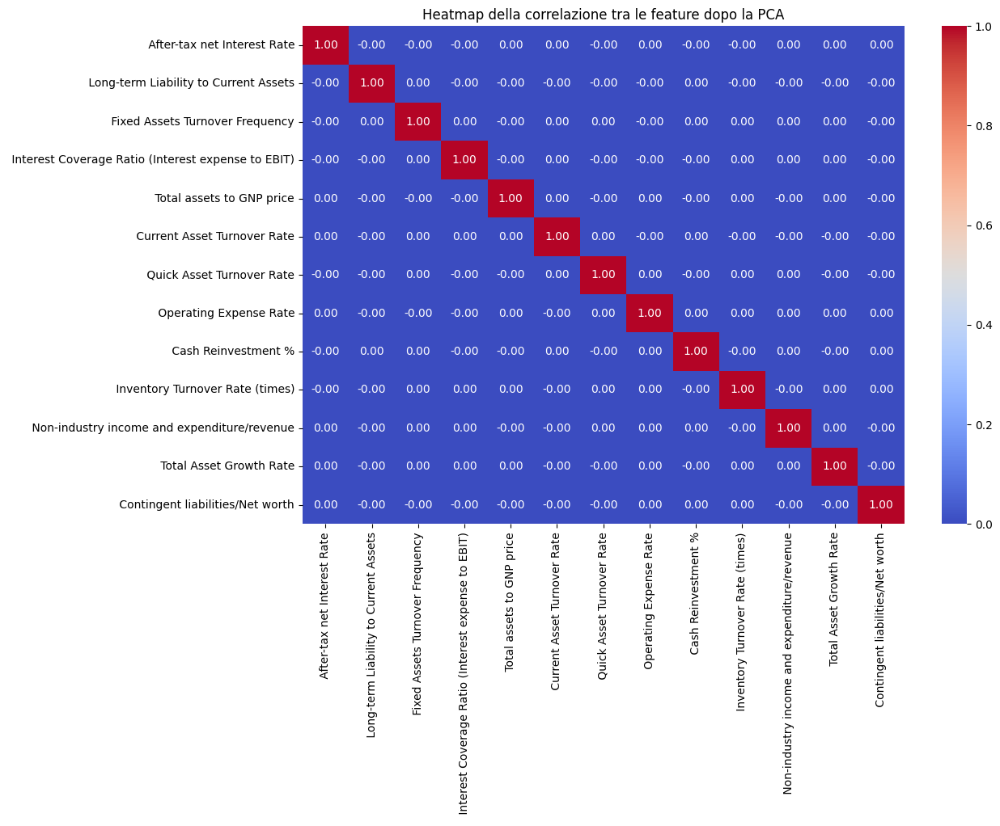

In [6]:
correlation_matrix_pca = X_resampled_pca_df.corr()

plt.figure(figsize=(12, 8))
sns.heatmap(
    correlation_matrix_pca,      # Lascia i valori invariati
    annot=True,                  # Mostra i valori nelle celle
    cmap="coolwarm",
    fmt=".2f",                   # Mostra due cifre decimali tra 0 e 1
    cbar=True
)
plt.title("Heatmap della correlazione tra le feature dopo la PCA")
plt.show()

Nel nostro caso notiamo che si ha correlazione massima (<tt>`1`</tt>) solamente nella diagonale principale e, al di fuori di essa, si ha solamente correlazione minima.
Questo è normale poiché la PCA trasforma le feature originali in componenti principali **ortogonali tra loro**; questo non significa che le variabili originali fossero non correlate, ma che la trasformazione ha reso le nuove variabili (componenti principali) indipendenti e non correlate.

In [7]:
X_resampled_pca_df.columns = X_resampled_pca_df.columns.str.strip()

X_resampled_pca_df = X_resampled_pca_df.rename(columns={
    'After-tax net Interest Rate': 'after_tax_interest_rate',
    'Long-term Liability to Current Assets':'long_term_liability_current_assets',
    'Fixed Assets Turnover Frequency':'fixed_assets_turnover',
    'Interest Coverage Ratio (Interest expense to EBIT)':'interest_coverage_ratio',
    'Total assets to GNP price':'total_assets_gnp_price',
    'Current Asset Turnover Rate':'current_asset_turnover',
    'Quick Asset Turnover Rate':'quick_asset_turnover',
    'Operating Expense Rate':'operating_expense_rate',
    'Cash Reinvestment %':'cash_reinvestment_percent',
    'Inventory Turnover Rate (times)':'inventory_turnover',
    'Non-industry income and expenditure/revenue':'non_industry_income_revenue',
    'Total Asset Growth Rate':'total_asset_growth_rate',
    'Contingent liabilities/Net worth':'contingent_liabilities_net_worth'
})

X_resampled_pca_df.head()

,after_tax_interest_rate,long_term_liability_current_assets,fixed_assets_turnover,interest_coverage_ratio,total_assets_gnp_price,current_asset_turnover,quick_asset_turnover,operating_expense_rate,cash_reinvestment_percent,inventory_turnover,non_industry_income_revenue,total_asset_growth_rate,contingent_liabilities_net_worth
0,0.418944,0.886512,0.289370,0.340911,0.731539,0.385872,0.937638,-0.112390,0.020844,-0.319386,0.413772,-0.002856,0.319827
1,0.909974,-0.551460,-0.708296,0.101686,-0.354422,0.306735,-0.565882,0.068329,-0.300255,0.132747,0.209308,-0.115255,0.322304
2,1.249655,-0.013893,0.408501,0.183031,0.053652,-0.532438,-0.004706,-0.288669,-0.362710,0.136287,0.083623,-0.317086,0.679130
3,0.465821,0.954853,-1.387243,0.259670,0.372874,0.404646,0.220350,0.439353,0.043924,-0.060722,0.100884,0.170759,-0.046920
4,0.470994,0.317270,-0.596817,0.278959,0.189745,0.010088,0.567218,0.146731,-0.015665,-0.196129,0.046866,0.262964,-0.062720


In [16]:
print(y_resampled.value_counts())
y_resampled.head()

bankrupt
False    5286
True     5286
Name: count, dtype: int64


0    False
1    False
2    False
3    False
4    False
Name: bankrupt, dtype: bool

# Classificazione: K-Nearest Neighbour con Holdout e K-Fold Cross Validation
Inizialmente il dataset viene diviso tramite approccio Holdout.
Il test set viene tenuto isolato per il test finale, mentre, tramite la K-fold Cross Validation, il training set viene diviso nuovamente in:
- Training Set;
- Validation Set.
In questo modo, K-Fold permette di ottimizzare il modello utilizzando tutto il training set in modo iterativo, senza toccare il test set.
Infine, dopo aver selezionato il modello migliore grazie a K-Fold, lo si applica al test set generato inizialmente con Holdout, per calcolare le metriche di performance definitive.

Fold 1
Accuracy per il Fold 1: 0.95
Fold 2
Accuracy per il Fold 2: 0.94
Fold 3
Accuracy per il Fold 3: 0.95
Fold 4
Accuracy per il Fold 4: 0.96
Fold 5
Accuracy per il Fold 5: 0.93
Fold 6
Accuracy per il Fold 6: 0.95
Fold 7
Accuracy per il Fold 7: 0.94
Fold 8
Accuracy per il Fold 8: 0.95
Fold 9
Accuracy per il Fold 9: 0.93
Fold 10
Accuracy per il Fold 10: 0.95

Accuracy sul test set: 0.93

Classification Report (Test Set):
              precision    recall  f1-score   support

       False       1.00      0.87      0.93      1068
        True       0.88      1.00      0.94      1047

    accuracy                           0.93      2115
   macro avg       0.94      0.94      0.93      2115
weighted avg       0.94      0.93      0.93      2115


Accuracy media sui fold della Cross Validation:
Media accuracy: 0.95


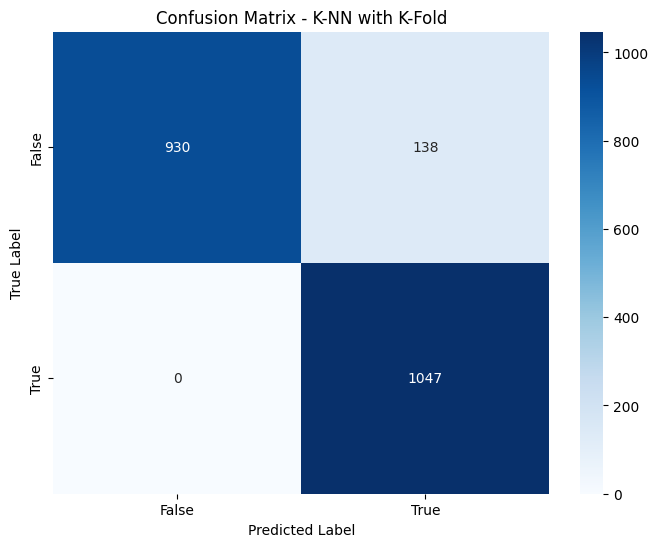

In [ ]:
# Step 1: Divisione dei dati in training e test set (Holdout)
X_train, X_test, y_train, y_test = train_test_split(X_resampled_pca_df, y_resampled, test_size=0.2, random_state=42)

# Step 2: Configurazione del K-Fold Cross Validation
kf = KFold(n_splits=10, shuffle=True, random_state=42)
fold_accuracies = []

# Step 3: Applicazione del K-Fold sul training set
for fold, (train_idx, val_idx) in enumerate(kf.split(X_train)):
    print(f"Fold {fold + 1}")
    
    # Divisione dei dati in training e validation set
    X_train_fold, X_val_fold = X_train.iloc[train_idx], X_train.iloc[val_idx]
    y_train_fold, y_val_fold = y_train.iloc[train_idx], y_train.iloc[val_idx]
    
    # Inizializzazione del modello K-NN
    knn_model = KNeighborsClassifier(n_neighbors=5)  # Usa 5 vicini
    
    # Addestramento del modello sui dati di training del fold
    knn_model.fit(X_train_fold, y_train_fold)
    
    # Predizione sul validation set
    y_val_pred = knn_model.predict(X_val_fold)
    
    # Calcolo dell'accuracy per il validation set
    fold_accuracy = accuracy_score(y_val_fold, y_val_pred)
    fold_accuracies.append(fold_accuracy)
    
    print(f"Accuracy per il Fold {fold + 1}: {fold_accuracy:.2f}")

# Step 4: Valutazione del modello sul test set
final_knn_model = KNeighborsClassifier(n_neighbors=5)
final_knn_model.fit(X_train, y_train)

y_test_pred = final_knn_model.predict(X_test)

# Calcolo delle metriche sul test set
test_accuracy = accuracy_score(y_test, y_test_pred)
print(f"\nAccuracy sul test set: {test_accuracy:.2f}")

print("\nClassification Report (Test Set):")
print(classification_report(y_test, y_test_pred))

print("\nAccuracy media sui fold della Cross Validation:")
print(f"Media accuracy: {np.mean(fold_accuracies):.2f}")

# Confusion matrix
conf_matrix = confusion_matrix(y_test, y_test_pred)

plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix, annot=True, fmt="d", cmap="Blues", xticklabels=['False', 'True'], yticklabels=['False', 'True'])
plt.title("Confusion Matrix - K-NN with K-Fold")
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.show()

#### Curva ROC

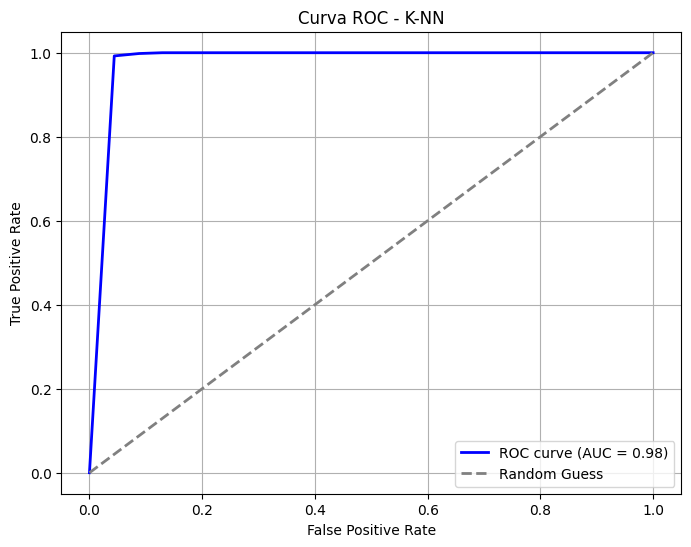


Area Under the Curve (AUC): 0.98


In [16]:
# Calcola le probabilità per la curva ROC
y_test_proba = final_knn_model.predict_proba(X_test)[:, 1]  # Probabilità della classe positiva

# Calcolo di FPR (False Positive Rate), TPR (True Positive Rate) e soglie
fpr, tpr, thresholds = roc_curve(y_test, y_test_proba)
roc_auc = auc(fpr, tpr)

# Disegna la curva ROC
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, color='blue', lw=2, label=f"ROC curve (AUC = {roc_auc:.2f})")
plt.plot([0, 1], [0, 1], color='gray', linestyle='--', lw=2, label="Random Guess")
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("Curva ROC - K-NN")
plt.legend(loc="lower right")
plt.grid()
plt.show()

print(f"\nArea Under the Curve (AUC): {roc_auc:.2f}")


# Classificazione: K-Nearest Neighbour con Holdout + K-Fold Cross Validation e Grid Search

Fitting 10 folds for each of 30 candidates, totalling 300 fits
Migliori parametri trovati:
{'metric': 'euclidean', 'n_neighbors': 3, 'weights': 'distance'}

Accuracy sul test set: 0.95

Classification Report (Test Set):
              precision    recall  f1-score   support

       False       1.00      0.90      0.95      1068
        True       0.91      1.00      0.95      1047

    accuracy                           0.95      2115
   macro avg       0.95      0.95      0.95      2115
weighted avg       0.95      0.95      0.95      2115



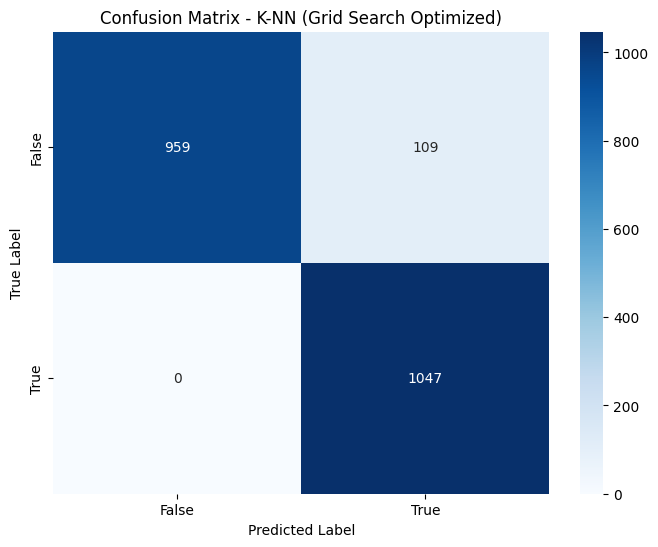

In [ ]:
# Step 1: Divisione dei dati in training e test set (Holdout)
X_train, X_test, y_train, y_test = train_test_split(X_resampled_pca_df, y_resampled, test_size=0.2, random_state=42)

# Step 2: Configurazione degli iperparametri per la Grid Search
param_grid = {
    'n_neighbors': [3, 5, 7, 9, 11],  # Numero di vicini da considerare
    'weights': ['uniform', 'distance'],  # Tipo di peso (uguale o basato sulla distanza)
    'metric': ['euclidean', 'manhattan', 'minkowski']  # Metriche di distanza
}

# Step 3: Configurazione della Grid Search con K-Fold Cross Validation
knn_model = KNeighborsClassifier()  # Modello base

grid_search = GridSearchCV(
    estimator=knn_model, # Modello da ottimizzare
    param_grid=param_grid, # Griglia degli iperparametri
    scoring='accuracy',  # Valutazione basata sull'accuracy
    cv=10,               # K-Fold Cross Validation
    verbose=1, # Mostra i dettagli
    n_jobs=-1            # Usa tutti i processori disponibili
)

# Step 4: Esecuzione della Grid Search sul training set
grid_search.fit(X_train, y_train)

# Step 5: Ottieni il miglior modello e parametri dai risultati della Grid Search
best_knn_model = grid_search.best_estimator_
print(f"Migliori parametri trovati:\n{grid_search.best_params_}")

# Step 6: Valutazione del modello ottimizzato sul test set
y_test_pred = best_knn_model.predict(X_test)

# Calcolo delle metriche sul test set
test_accuracy = accuracy_score(y_test, y_test_pred)
print(f"\nAccuracy sul test set: {test_accuracy:.2f}")

# Classification Report
print("\nClassification Report (Test Set):")
print(classification_report(y_test, y_test_pred))

# Confusion Matrix
conf_matrix = confusion_matrix(y_test, y_test_pred)

plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix, annot=True, fmt="d", cmap="Blues", xticklabels=['False', 'True'], yticklabels=['False', 'True'])
plt.title("Confusion Matrix - K-NN (Grid Search Optimized)")
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.show()

#### Curva ROC

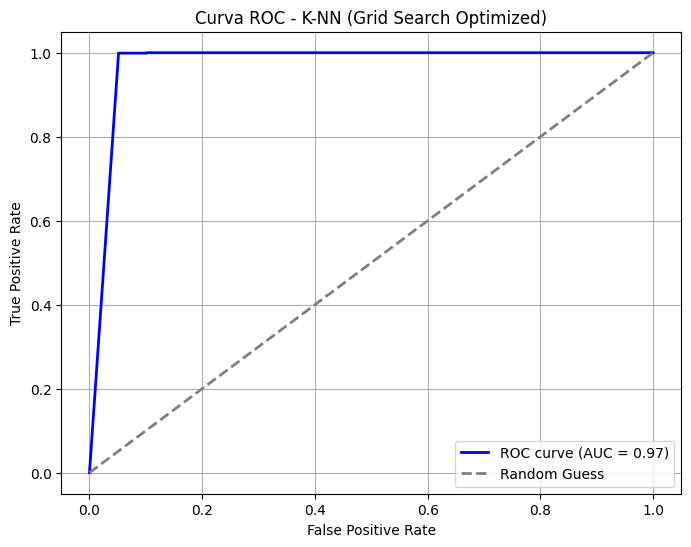

In [18]:
# Calcola le probabilità per la curva ROC
y_test_proba = best_knn_model.predict_proba(X_test)[:, 1]  # Probabilità della classe positiva

# Calcolo di FPR (False Positive Rate), TPR (True Positive Rate) e soglie
fpr, tpr, thresholds = roc_curve(y_test, y_test_proba)
roc_auc = auc(fpr, tpr)

# Disegna la curva ROC
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, color='blue', lw=2, label=f"ROC curve (AUC = {roc_auc:.2f})")
plt.plot([0, 1], [0, 1], color='gray', linestyle='--', lw=2, label="Random Guess")
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("Curva ROC - K-NN (Grid Search Optimized)")
plt.legend(loc="lower right")
plt.grid()
plt.show()

# <mark> Classificazione: Decision Tree con Holdout </mark>

Accuracy sul training set: 1.00
Accuracy sul test set: 0.94

Classification Report (Test Set):
              precision    recall  f1-score   support

       False       0.97      0.91      0.94      1068
        True       0.91      0.97      0.94      1047

    accuracy                           0.94      2115
   macro avg       0.94      0.94      0.94      2115
weighted avg       0.94      0.94      0.94      2115



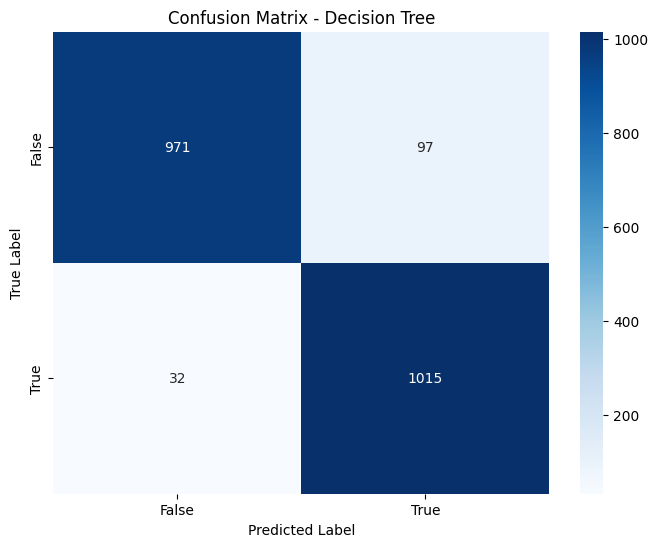

In [19]:
# Divisione del dataset in training e test set
X_train, X_test, y_train, y_test = train_test_split(X_resampled_pca_df, y_resampled, test_size=0.2, random_state=42)

# Inizializzazione del modello Decision Tree
dt_model = DecisionTreeClassifier(random_state=42)

# Addestramento del modello sui dati di training
dt_model.fit(X_train, y_train)

# Predizione sul training set e sul test set
y_train_pred = dt_model.predict(X_train)
y_test_pred = dt_model.predict(X_test)

# Calcolo dell'accuracy per il training e il test set
train_accuracy = accuracy_score(y_train, y_train_pred)
test_accuracy = accuracy_score(y_test, y_test_pred)

print(f"Accuracy sul training set: {train_accuracy:.2f}")
print(f"Accuracy sul test set: {test_accuracy:.2f}")

# Classification report per il test set
print("\nClassification Report (Test Set):")
print(classification_report(y_test, y_test_pred))

# Confusion matrix per il test set
conf_matrix = confusion_matrix(y_test, y_test_pred)

# Matrice di confusione come heatmap
plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix, annot=True, fmt="d", cmap="Blues", xticklabels=['False', 'True'], yticklabels=['False', 'True'])
plt.title("Confusion Matrix - Decision Tree")
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.show()

#### Curva ROC

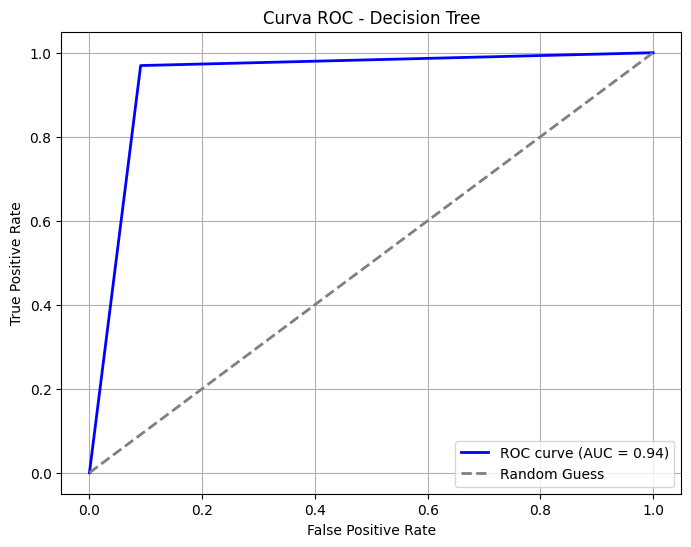

In [20]:
# Calcolo delle probabilità per la curva ROC
y_test_proba = dt_model.predict_proba(X_test)[:, 1]  # Probabilità della classe positiva

# Calcolo di FPR (False Positive Rate), TPR (True Positive Rate) e soglie
fpr, tpr, thresholds = roc_curve(y_test, y_test_proba)
roc_auc = auc(fpr, tpr)  # Calcola l'area sotto la curva ROC (AUC)

plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, color='blue', lw=2, label=f"ROC curve (AUC = {roc_auc:.2f})")
plt.plot([0, 1], [0, 1], color='gray', linestyle='--', lw=2, label="Random Guess")
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("Curva ROC - Decision Tree")
plt.legend(loc="lower right")
plt.grid()
plt.show()

# <mark> Classificazione: Decision Tree con Holdout e Grid Search </mark>

Fitting 5 folds for each of 72 candidates, totalling 360 fits
Migliori parametri trovati: {'criterion': 'entropy', 'max_depth': 30, 'min_samples_leaf': 1, 'min_samples_split': 2}

Accuracy sul test set: 0.94

Classification Report (Test Set):
              precision    recall  f1-score   support

       False       0.96      0.92      0.94      1068
        True       0.92      0.97      0.94      1047

    accuracy                           0.94      2115
   macro avg       0.94      0.94      0.94      2115
weighted avg       0.94      0.94      0.94      2115



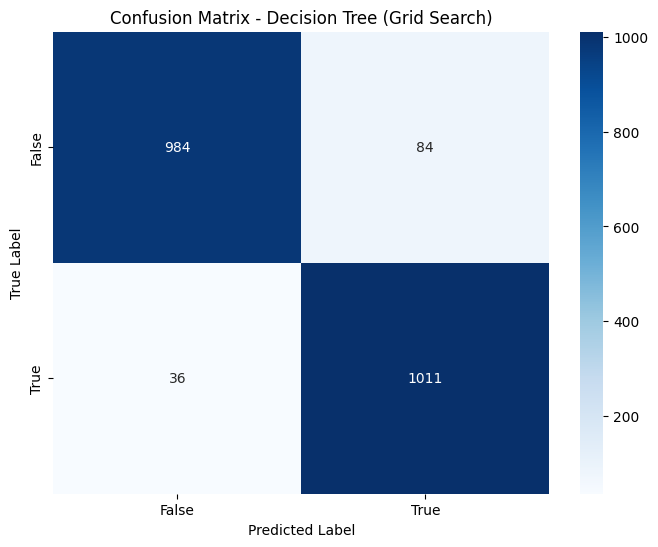

In [23]:
# Step 1: Divisione del dataset in training e test set
X_train, X_test, y_train, y_test = train_test_split(X_resampled_pca_df, y_resampled, test_size=0.2, random_state=42)

# Step 2: Configurazione dei parametri per la Grid Search
param_grid = {
    'criterion': ['gini', 'entropy'],  # Criterio di split
    'max_depth': [10, 20, 30, None],  # Profondità massima dell'albero
    'min_samples_split': [2, 5, 10],  # Numero minimo di campioni per dividere un nodo
    'min_samples_leaf': [1, 5, 10]  # Numero minimo di campioni in una foglia
}

# Step 3: Inizializzazione del modello Decision Tree
dt_model = DecisionTreeClassifier(random_state=42)

# Step 4: Configurazione del GridSearchCV
grid_search = GridSearchCV(estimator=dt_model, param_grid=param_grid, cv=5, scoring='accuracy', verbose=1, n_jobs=-1)

# Step 5: Esecuzione della Grid Search
grid_search.fit(X_train, y_train)

# Step 6: Ottieni il miglior modello
best_model = grid_search.best_estimator_
print(f"Migliori parametri trovati: {grid_search.best_params_}")

# Step 7: Valutazione del modello sul test set
y_test_pred = best_model.predict(X_test)
test_accuracy = accuracy_score(y_test, y_test_pred)
print(f"\nAccuracy sul test set: {test_accuracy:.2f}")

# Classification report
print("\nClassification Report (Test Set):")
print(classification_report(y_test, y_test_pred))

# Confusion matrix
conf_matrix = confusion_matrix(y_test, y_test_pred)

plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix, annot=True, fmt="d", cmap="Blues", xticklabels=['False', 'True'], yticklabels=['False', 'True'])
plt.title("Confusion Matrix - Decision Tree (Grid Search)")
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.show()

#### Curva ROC

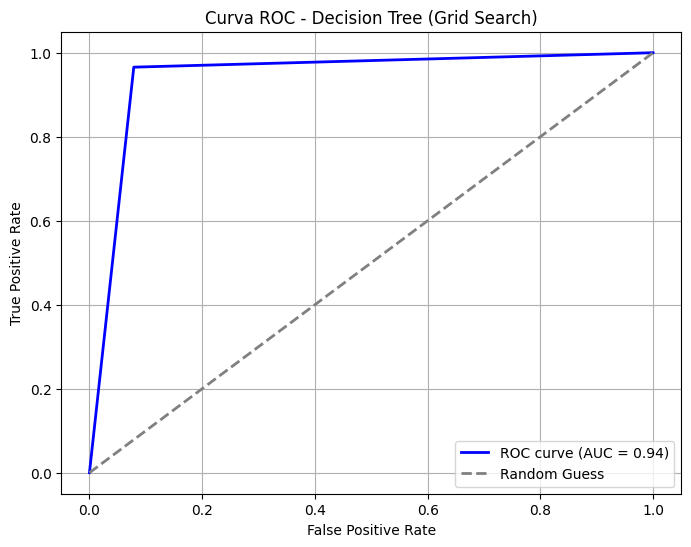

In [25]:
# Calcolo delle probabilità per la classe positiva
y_test_proba = best_model.predict_proba(X_test)[:, 1]  # Probabilità della classe positiva

# Calcolo di FPR (False Positive Rate), TPR (True Positive Rate) e soglie
fpr, tpr, thresholds = roc_curve(y_test, y_test_proba)
roc_auc = auc(fpr, tpr)  # Calcola l'area sotto la curva ROC (AUC)

# Visualizzazione della curva ROC
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, color='blue', lw=2, label=f"ROC curve (AUC = {roc_auc:.2f})")
plt.plot([0, 1], [0, 1], color='gray', linestyle='--', lw=2, label="Random Guess")
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("Curva ROC - Decision Tree (Grid Search)")
plt.legend(loc="lower right")
plt.grid()
plt.show()


# Classificazione: Decision Tree con Holdout + K-fold Cross Validation

Fold 1
Accuracy per il Fold 1: 0.94
Fold 2
Accuracy per il Fold 2: 0.95
Fold 3
Accuracy per il Fold 3: 0.94
Fold 4
Accuracy per il Fold 4: 0.94
Fold 5
Accuracy per il Fold 5: 0.95
Fold 6
Accuracy per il Fold 6: 0.95
Fold 7
Accuracy per il Fold 7: 0.95
Fold 8
Accuracy per il Fold 8: 0.94
Fold 9
Accuracy per il Fold 9: 0.95
Fold 10
Accuracy per il Fold 10: 0.95

Accuracy sul test set: 0.94

Classification Report (Test Set):
              precision    recall  f1-score   support

       False       0.97      0.91      0.94      1068
        True       0.91      0.97      0.94      1047

    accuracy                           0.94      2115
   macro avg       0.94      0.94      0.94      2115
weighted avg       0.94      0.94      0.94      2115


Accuracy media sui fold della Cross Validation:
Media accuracy: 0.95


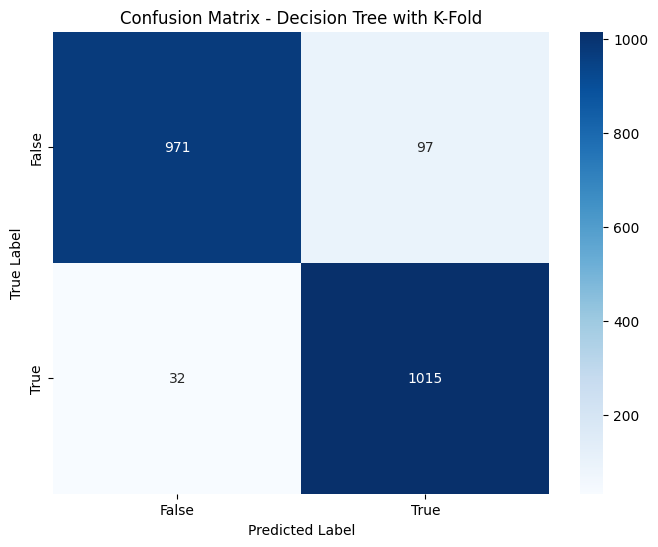

In [9]:
# Step 1: Divisione dei dati in training e test set (Holdout)
X_train, X_test, y_train, y_test = train_test_split(X_resampled_pca_df, y_resampled, test_size=0.2, random_state=42)

# Step 2: Configurazione del K-Fold Cross Validation
kf = KFold(n_splits=10, shuffle=True, random_state=42)
fold_accuracies = []

# Step 3: Applicazione del K-Fold sul training set
for fold, (train_idx, val_idx) in enumerate(kf.split(X_train)):
    print(f"Fold {fold + 1}")
    
    # Divisione dei dati in training e validation set
    X_train_fold, X_val_fold = X_train.iloc[train_idx], X_train.iloc[val_idx]
    y_train_fold, y_val_fold = y_train.iloc[train_idx], y_train.iloc[val_idx]
    
    # Inizializzazione del modello
    dt_model = DecisionTreeClassifier(random_state=42)
    
    # Addestramento del modello sui dati di training del fold
    dt_model.fit(X_train_fold, y_train_fold)
    
    # Predizione sul validation set
    y_val_pred = dt_model.predict(X_val_fold)
    
    # Calcolo dell'accuracy per il validation set
    fold_accuracy = accuracy_score(y_val_fold, y_val_pred)
    fold_accuracies.append(fold_accuracy)
    
    print(f"Accuracy per il Fold {fold + 1}: {fold_accuracy:.2f}")

# Step 4: Valutazione del modello sul test set
final_model = DecisionTreeClassifier(random_state=42)
final_model.fit(X_train, y_train)

y_test_pred = final_model.predict(X_test)

# Calcolo delle metriche sul test set
test_accuracy = accuracy_score(y_test, y_test_pred)
print(f"\nAccuracy sul test set: {test_accuracy:.2f}")

print("\nClassification Report (Test Set):")
print(classification_report(y_test, y_test_pred))

print("\nAccuracy media sui fold della Cross Validation:")
print(f"Media accuracy: {np.mean(fold_accuracies):.2f}")

# Confusion matrix
conf_matrix = confusion_matrix(y_test, y_test_pred)

plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix, annot=True, fmt="d", cmap="Blues", xticklabels=['False', 'True'], yticklabels=['False', 'True'])
plt.title("Confusion Matrix - Decision Tree with K-Fold")
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.show()

#### Curva ROC

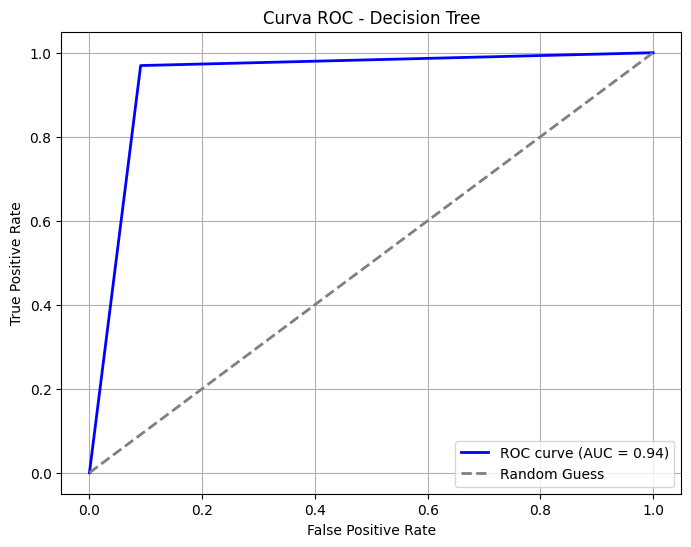

In [10]:
# Calcola le probabilità per la curva ROC
y_test_proba = final_model.predict_proba(X_test)[:, 1]  # Probabilità della classe positiva

# Calcolo di FPR (False Positive Rate), TPR (True Positive Rate) e soglie
fpr, tpr, thresholds = roc_curve(y_test, y_test_proba)
roc_auc = auc(fpr, tpr)

# Disegna la curva ROC
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, color='blue', lw=2, label=f"ROC curve (AUC = {roc_auc:.2f})")
plt.plot([0, 1], [0, 1], color='gray', linestyle='--', lw=2, label="Random Guess")
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("Curva ROC - Decision Tree")
plt.legend(loc="lower right")
plt.grid()
plt.show()


# Classificazione: Decision Tree con Holdout + K-fold Cross Validation e Grid Search

Fitting 10 folds for each of 72 candidates, totalling 720 fits
Migliori parametri trovati:
{'criterion': 'entropy', 'max_depth': 20, 'min_samples_leaf': 1, 'min_samples_split': 2}

Accuracy sul test set: 0.94

Classification Report (Test Set):
              precision    recall  f1-score   support

       False       0.96      0.92      0.94      1068
        True       0.92      0.97      0.94      1047

    accuracy                           0.94      2115
   macro avg       0.94      0.94      0.94      2115
weighted avg       0.94      0.94      0.94      2115



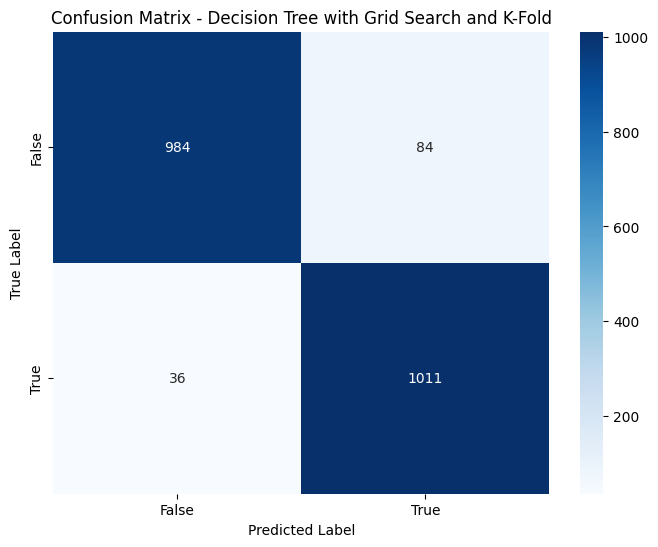

In [ ]:
# Step 1: Divisione del dataset in training e test set
X_train, X_test, y_train, y_test = train_test_split(X_resampled_pca_df, y_resampled, test_size=0.2, random_state=42)

# Step 2: Configurazione dei parametri per la Grid Search
param_grid = {
    'criterion': ['gini', 'entropy'],  # Criterio di split
    'max_depth': [10, 20, 30, None],  # Profondità massima dell'albero
    'min_samples_split': [2, 5, 10],  # Numero minimo di campioni per dividere un nodo
    'min_samples_leaf': [1, 5, 10]  # Numero minimo di campioni in una foglia
}

# Step 3: Configurazione del K-Fold Cross Validation
kf = KFold(n_splits=10, shuffle=True, random_state=42)

# Step 4: Configurazione del GridSearchCV con K-Fold
grid_search = GridSearchCV(
    estimator=DecisionTreeClassifier(random_state=42),
    param_grid=param_grid,
    scoring='accuracy',
    cv=kf,
    verbose=1,
    n_jobs=-1
)

# Step 5: Esecuzione della Grid Search sul training set
grid_search.fit(X_train, y_train)

# Step 6: Ottieni il miglior modello dai risultati della Grid Search
best_model = grid_search.best_estimator_
print(f"Migliori parametri trovati:\n{grid_search.best_params_}")

# Step 7: Valutazione del miglior modello sul test set
y_test_pred = best_model.predict(X_test)

# Calcolo dell'accuracy sul test set
test_accuracy = accuracy_score(y_test, y_test_pred)
print(f"\nAccuracy sul test set: {test_accuracy:.2f}")

# Classification report
print("\nClassification Report (Test Set):")
print(classification_report(y_test, y_test_pred))

# Confusion matrix
conf_matrix = confusion_matrix(y_test, y_test_pred)

plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix, annot=True, fmt="d", cmap="Blues", xticklabels=['False', 'True'], yticklabels=['False', 'True'])
plt.title("Confusion Matrix - Decision Tree with Grid Search and K-Fold")
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.show()

#### Curva ROC

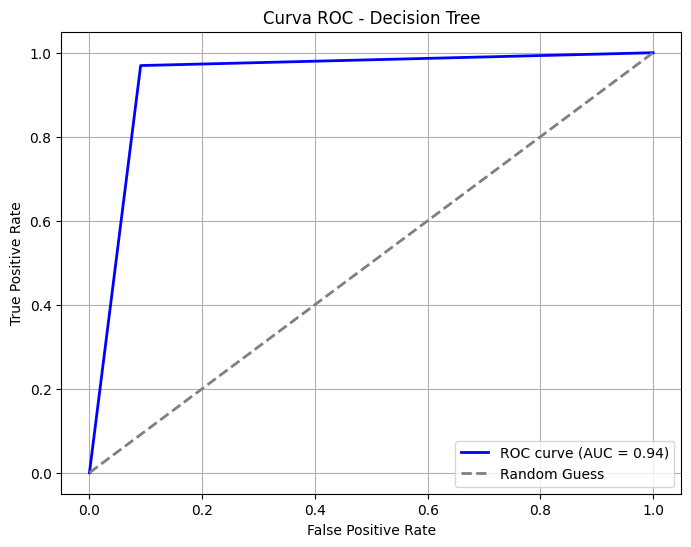

In [12]:
# Calcola le probabilità per la curva ROC
y_test_proba = final_model.predict_proba(X_test)[:, 1]  # Probabilità della classe positiva

# Calcolo di FPR (False Positive Rate), TPR (True Positive Rate) e soglie
fpr, tpr, thresholds = roc_curve(y_test, y_test_proba)
roc_auc = auc(fpr, tpr)

# Disegna la curva ROC
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, color='blue', lw=2, label=f"ROC curve (AUC = {roc_auc:.2f})")
plt.plot([0, 1], [0, 1], color='gray', linestyle='--', lw=2, label="Random Guess")
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("Curva ROC - Decision Tree")
plt.legend(loc="lower right")
plt.grid()
plt.show()

# <mark> Classificazione: Random Forest e Holdout </mark>

Accuracy sul training set: 0.93
Accuracy sul test set: 0.88

Classification Report (Test Set):
              precision    recall  f1-score   support

       False       0.91      0.86      0.88      1068
        True       0.86      0.91      0.88      1047

    accuracy                           0.88      2115
   macro avg       0.88      0.88      0.88      2115
weighted avg       0.88      0.88      0.88      2115



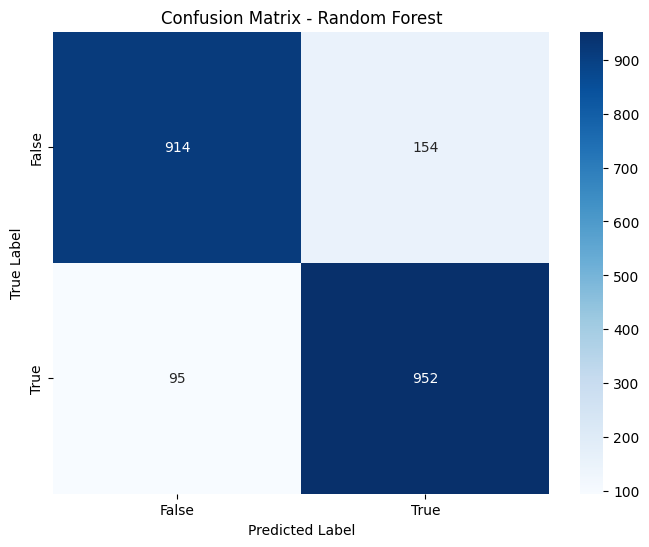

In [ ]:
# Inizializzazione del modello Random Forest
rf_model = RandomForestClassifier(
    random_state=42, # Imposta il seed per la riproducibilità
    n_estimators=200, # Numero di alberi nella foresta
    max_depth=20, # Profondità massima di ciascun albero
    min_samples_leaf=20, # Numero minimo di campioni in una foglia
    )

# Addestramento del modello sui dati di training
rf_model.fit(X_train, y_train)

# Predizione sul training set e sul test set
y_train_pred = rf_model.predict(X_train)
y_test_pred = rf_model.predict(X_test)

# Calcolo dell'accuracy per il training e il test set
train_accuracy = accuracy_score(y_train, y_train_pred)
test_accuracy = accuracy_score(y_test, y_test_pred)

print(f"Accuracy sul training set: {train_accuracy:.2f}")
print(f"Accuracy sul test set: {test_accuracy:.2f}")

# Classification report
print("\nClassification Report (Test Set):")
print(classification_report(y_test, y_test_pred))

# Confusion matrix
conf_matrix = confusion_matrix(y_test, y_test_pred)

plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix, annot=True, fmt="d", cmap="Blues", xticklabels=['False', 'True'], yticklabels=['False', 'True'])
plt.title("Confusion Matrix - Random Forest")
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.show()

#### Curva ROC

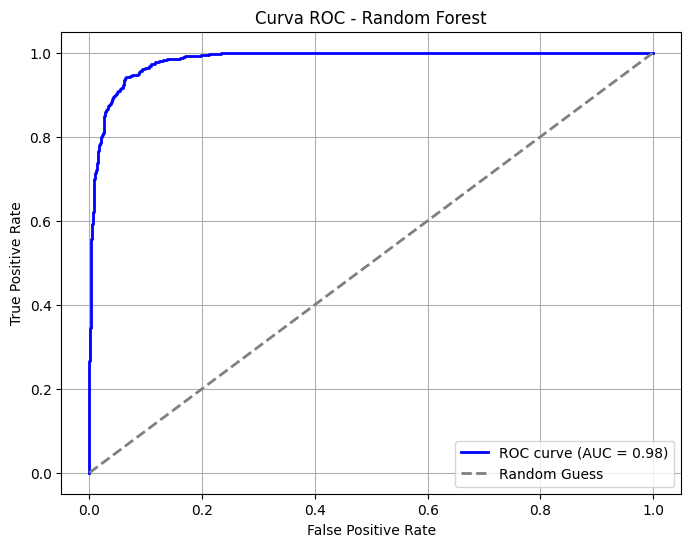

In [ ]:
# Calcola le probabilità per la curva ROC
y_test_proba = rf_model.predict_proba(X_test)[:, 1]  # Probabilità della classe positiva

# Calcolo di FPR (False Positive Rate), TPR (True Positive Rate) e soglie
fpr, tpr, thresholds = roc_curve(y_test, y_test_proba)
roc_auc = auc(fpr, tpr)

# Disegna la curva ROC
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, color='blue', lw=2, label=f"ROC curve (AUC = {roc_auc:.2f})")
plt.plot([0, 1], [0, 1], color='gray', linestyle='--', lw=2, label="Random Guess")
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("Curva ROC - Random Forest")
plt.legend(loc="lower right")
plt.grid()
plt.show()

# <mark> Classificazione: Random Forest e Holdout con Grid Search </mark>

Fitting 10 folds for each of 162 candidates, totalling 1620 fits
Migliori parametri trovati:
{'criterion': 'entropy', 'max_depth': None, 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 50}

Accuracy sul test set: 0.97

Classification Report (Test Set):
              precision    recall  f1-score   support

       False       0.99      0.95      0.97      1068
        True       0.95      0.99      0.97      1047

    accuracy                           0.97      2115
   macro avg       0.97      0.97      0.97      2115
weighted avg       0.97      0.97      0.97      2115



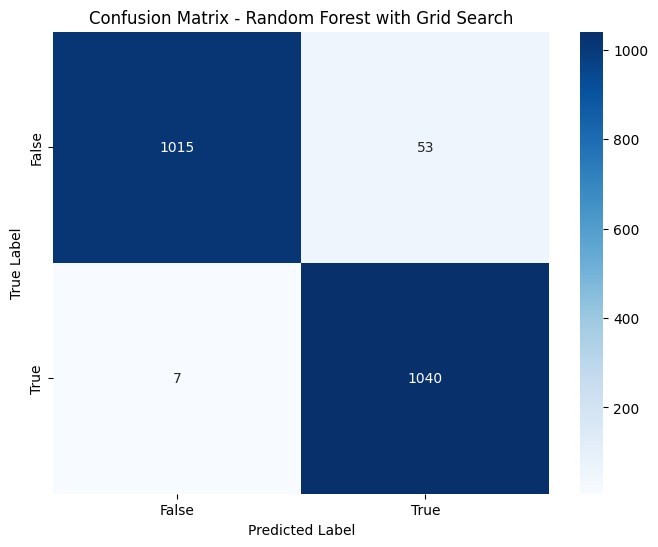

In [30]:
# Step 1: Divisione del dataset in training e test set
X_train, X_test, y_train, y_test = train_test_split(X_resampled_pca_df, y_resampled, test_size=0.2, random_state=42)

# Step 2: Configurazione dei parametri per la Grid Search
param_grid = {
    'n_estimators': [50, 10, 200],  # Numero di alberi
    'max_depth': [10, 20, None],  # Profondità massima
    'min_samples_split': [2, 5, 10],  # Numero minimo di campioni per dividere un nodo
    'min_samples_leaf': [1, 5, 10],  # Numero minimo di campioni in una foglia
    'criterion': ['gini', 'entropy']  # Criterio di split
}

# Step 3: Configurazione del GridSearchCV
grid_search = GridSearchCV(
    estimator=RandomForestClassifier(random_state=42),
    param_grid=param_grid,
    scoring='accuracy',
    cv=10,
    verbose=1,
    n_jobs=-1
)

# Step 4: Esecuzione della Grid Search sul training set
grid_search.fit(X_train, y_train)

# Step 5: Ottieni il miglior modello dai risultati della Grid Search
best_model = grid_search.best_estimator_
print(f"Migliori parametri trovati:\n{grid_search.best_params_}")

# Step 6: Valutzione del miglior modello sul test set
y_test_pred = best_model.predict(X_test)

# Calcolo dell'accuracy sul test set
test_accuracy = accuracy_score(y_test, y_test_pred)
print(f"\nAccuracy sul test set: {test_accuracy:.2f}")

# Classification report
print("\nClassification Report (Test Set):")
print(classification_report(y_test, y_test_pred))

# Confusion matrix
conf_matrix = confusion_matrix(y_test, y_test_pred)

plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix, annot=True, fmt="d", cmap="Blues", xticklabels=['False', 'True'], yticklabels=['False', 'True'])
plt.title("Confusion Matrix - Random Forest with Grid Search")
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.show()

#### Curva ROC

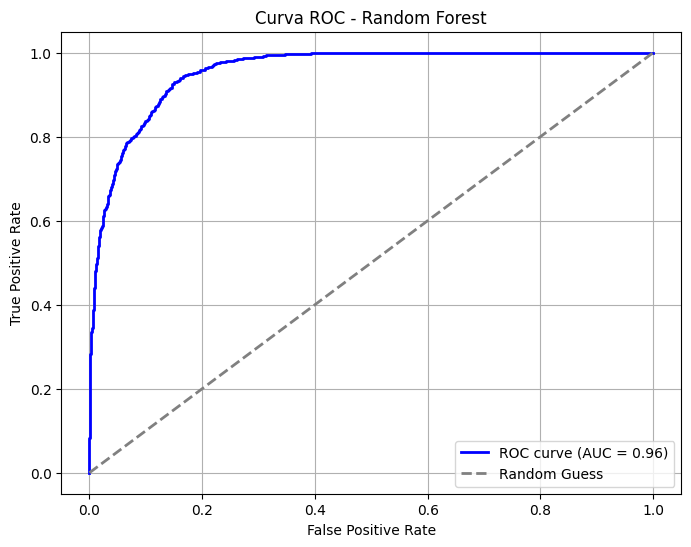

In [ ]:
# Calcola le probabilità per la curva ROC
y_test_proba = rf_model.predict_proba(X_test)[:, 1]  # Probabilità della classe positiva

# Calcolo di FPR (False Positive Rate), TPR (True Positive Rate) e soglie
fpr, tpr, thresholds = roc_curve(y_test, y_test_proba)
roc_auc = auc(fpr, tpr)

# Disegna la curva ROC
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, color='blue', lw=2, label=f"ROC curve (AUC = {roc_auc:.2f})")
plt.plot([0, 1], [0, 1], color='gray', linestyle='--', lw=2, label="Random Guess")
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("Curva ROC - Random Forest")
plt.legend(loc="lower right")
plt.grid()
plt.show()

# Classificazione: Random Forest e Holdout + K-fold Cross Validation

Fold 1
Accuracy per il Fold 1: 0.93
Fold 2
Accuracy per il Fold 2: 0.94
Fold 3
Accuracy per il Fold 3: 0.94
Fold 4
Accuracy per il Fold 4: 0.95
Fold 5
Accuracy per il Fold 5: 0.95
Fold 6
Accuracy per il Fold 6: 0.94
Fold 7
Accuracy per il Fold 7: 0.93
Fold 8
Accuracy per il Fold 8: 0.94
Fold 9
Accuracy per il Fold 9: 0.94
Fold 10
Accuracy per il Fold 10: 0.95

Accuracy sul test set: 0.93

Classification Report (Test Set):
              precision    recall  f1-score   support

       False       0.97      0.90      0.93      1068
        True       0.90      0.97      0.94      1047

    accuracy                           0.93      2115
   macro avg       0.94      0.93      0.93      2115
weighted avg       0.94      0.93      0.93      2115


Accuracy media sui fold della Cross Validation:
Media accuracy: 0.94


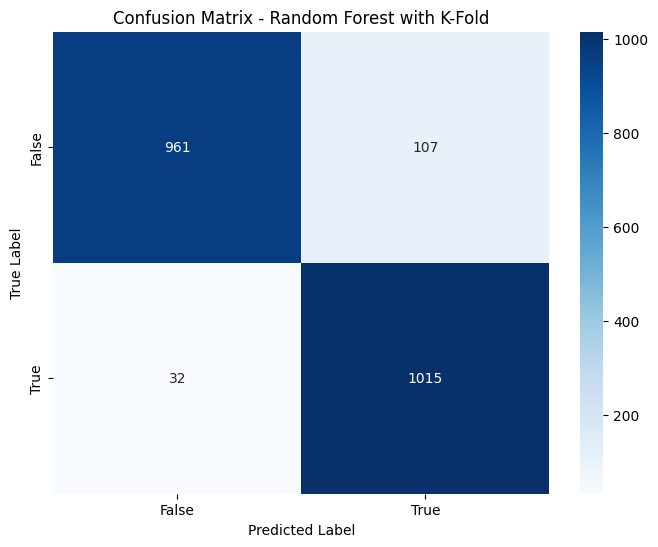

In [16]:
# Step 1: Divisione dei dati in training e test set (Holdout)
X_train, X_test, y_train, y_test = train_test_split(X_resampled_pca_df, y_resampled, test_size=0.2, random_state=42)

# Step 2: Configurazione del K-Fold Cross Validation
kf = KFold(n_splits=10, shuffle=True, random_state=42)
fold_accuracies = []

# Step 3: Applicazione del K-Fold sul training set
for fold, (train_idx, val_idx) in enumerate(kf.split(X_train)):
    print(f"Fold {fold + 1}")
    
    # Divisione dei dati in training e validation set
    X_train_fold, X_val_fold = X_train.iloc[train_idx], X_train.iloc[val_idx]
    y_train_fold, y_val_fold = y_train.iloc[train_idx], y_train.iloc[val_idx]
    
    # Inizializzazione del modello Random Forest
    rf_model = RandomForestClassifier(
        random_state=42, # Seed per la riproducibilità
        n_estimators=200,  # Numero di alberi
        max_depth=20,  # Profondità massima degli alberi
        min_samples_leaf=20  # Numero minimo di campioni in una foglia
    )
    
    # Addestramento del modello sui dati di training del fold
    rf_model.fit(X_train_fold, y_train_fold)
    
    # Predizione sul validation set
    y_val_pred = rf_model.predict(X_val_fold)
    
    # Calcolo dell'accuracy per il validation set
    fold_accuracy = accuracy_score(y_val_fold, y_val_pred)
    fold_accuracies.append(fold_accuracy)
    
    print(f"Accuracy per il Fold {fold + 1}: {fold_accuracy:.2f}")

# Step 4: Valutazione del modello sul test set
rf_model.fit(X_train, y_train)

y_test_pred = rf_model.predict(X_test)

# Calcolo delle metriche sul test set
test_accuracy = accuracy_score(y_test, y_test_pred)
print(f"\nAccuracy sul test set: {test_accuracy:.2f}")

print("\nClassification Report (Test Set):")
print(classification_report(y_test, y_test_pred))

print("\nAccuracy media sui fold della Cross Validation:")
print(f"Media accuracy: {np.mean(fold_accuracies):.2f}")

# Confusion matrix
conf_matrix = confusion_matrix(y_test, y_test_pred)

plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix, annot=True, fmt="d", cmap="Blues", xticklabels=['False', 'True'], yticklabels=['False', 'True'])
plt.title("Confusion Matrix - Random Forest with K-Fold")
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.show()

#### Curva ROC

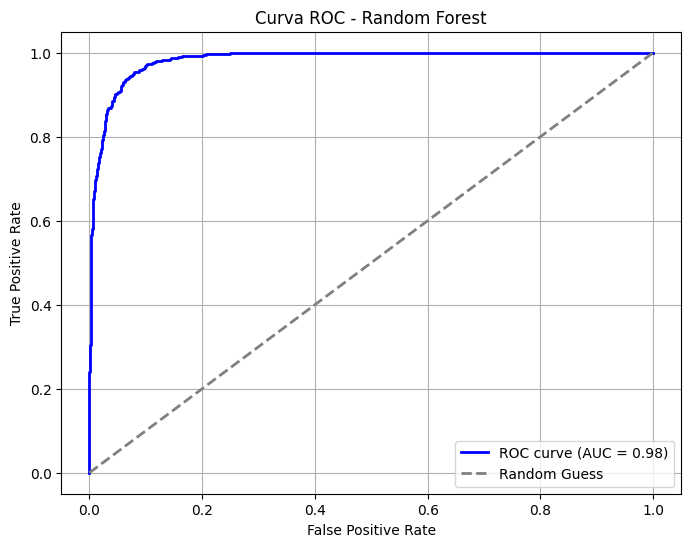

In [17]:
# Calcola le probabilità per la curva ROC
y_test_proba = rf_model.predict_proba(X_test)[:, 1]  # Probabilità della classe positiva

# Calcolo di FPR (False Positive Rate), TPR (True Positive Rate) e soglie
fpr, tpr, thresholds = roc_curve(y_test, y_test_proba)
roc_auc = auc(fpr, tpr)

# Disegna la curva ROC
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, color='blue', lw=2, label=f"ROC curve (AUC = {roc_auc:.2f})")
plt.plot([0, 1], [0, 1], color='gray', linestyle='--', lw=2, label="Random Guess")
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("Curva ROC - Random Forest")
plt.legend(loc="lower right")
plt.grid()
plt.show()

# Classificazione: Random Forest e Holdout + K-fold Cross Validation con Grid Search

Fitting 10 folds for each of 162 candidates, totalling 1620 fits
Migliori parametri trovati:
{'criterion': 'gini', 'max_depth': None, 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 200}

Accuracy sul test set: 0.97

Classification Report (Test Set):
              precision    recall  f1-score   support

       False       0.99      0.95      0.97      1068
        True       0.95      0.99      0.97      1047

    accuracy                           0.97      2115
   macro avg       0.97      0.97      0.97      2115
weighted avg       0.97      0.97      0.97      2115



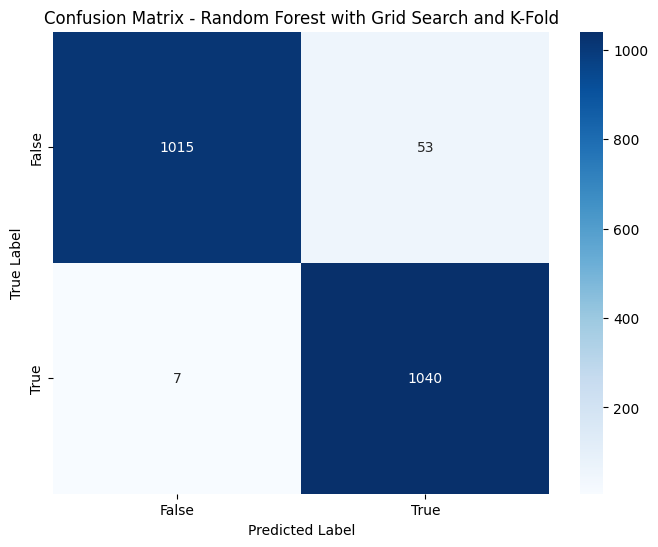

In [18]:
# Step 1: Divisione del dataset in training e test set
X_train, X_test, y_train, y_test = train_test_split(X_resampled_pca_df, y_resampled, test_size=0.2, random_state=42)

# Step 2: Configurazione dei parametri per la Grid Search
param_grid = {
    'n_estimators': [50, 10, 200],  # Numero di alberi
    'max_depth': [10, 20, None],  # Profondità massima
    'min_samples_split': [2, 5, 10],  # Numero minimo di campioni per dividere un nodo
    'min_samples_leaf': [1, 5, 10],  # Numero minimo di campioni in una foglia
    'criterion': ['gini', 'entropy']  # Criterio di split
}

# Step 3: Configurazione del K-Fold Cross Validation
kf = KFold(n_splits=10, shuffle=True, random_state=42)

# Step 4: Configurazione del GridSearchCV con K-Fold
grid_search = GridSearchCV(
    estimator=RandomForestClassifier(random_state=42), # Modello da ottimizzare
    param_grid=param_grid,
    scoring='accuracy',
    cv=kf,
    verbose=1,
    n_jobs=-1
)

# Step 5: Esecuzione della Grid Search sul training set
grid_search.fit(X_train, y_train)

# Step 6: Ottieni il miglior modello dai risultati della Grid Search
best_model = grid_search.best_estimator_
print(f"Migliori parametri trovati:\n{grid_search.best_params_}")

# Step 7: Valutazione del miglior modello sul test set
y_test_pred = best_model.predict(X_test)

# Calcolo dell'accuracy sul test set
test_accuracy = accuracy_score(y_test, y_test_pred)
print(f"\nAccuracy sul test set: {test_accuracy:.2f}")

# Classification report
print("\nClassification Report (Test Set):")
print(classification_report(y_test, y_test_pred))

# Confusion matrix
conf_matrix = confusion_matrix(y_test, y_test_pred)

plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix, annot=True, fmt="d", cmap="Blues", xticklabels=['False', 'True'], yticklabels=['False', 'True'])
plt.title("Confusion Matrix - Random Forest with Grid Search and K-Fold")
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.show()

#### Curva ROC

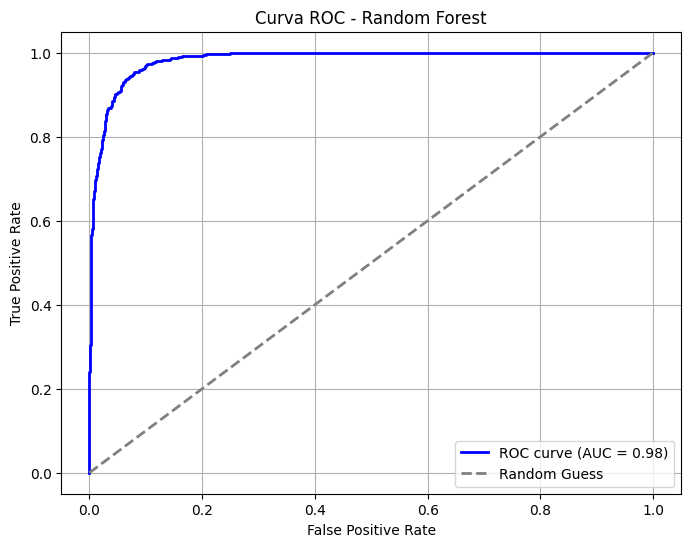

In [19]:
# Calcola le probabilità per la curva ROC
y_test_proba = rf_model.predict_proba(X_test)[:, 1]  # Probabilità della classe positiva

# Calcolo di FPR (False Positive Rate), TPR (True Positive Rate) e soglie
fpr, tpr, thresholds = roc_curve(y_test, y_test_proba)
roc_auc = auc(fpr, tpr)

# Disegna la curva ROC
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, color='blue', lw=2, label=f"ROC curve (AUC = {roc_auc:.2f})")
plt.plot([0, 1], [0, 1], color='gray', linestyle='--', lw=2, label="Random Guess")
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("Curva ROC - Random Forest")
plt.legend(loc="lower right")
plt.grid()
plt.show()

# Classificazione: rbf SVM (Holdout + K-fold Cross Validation)

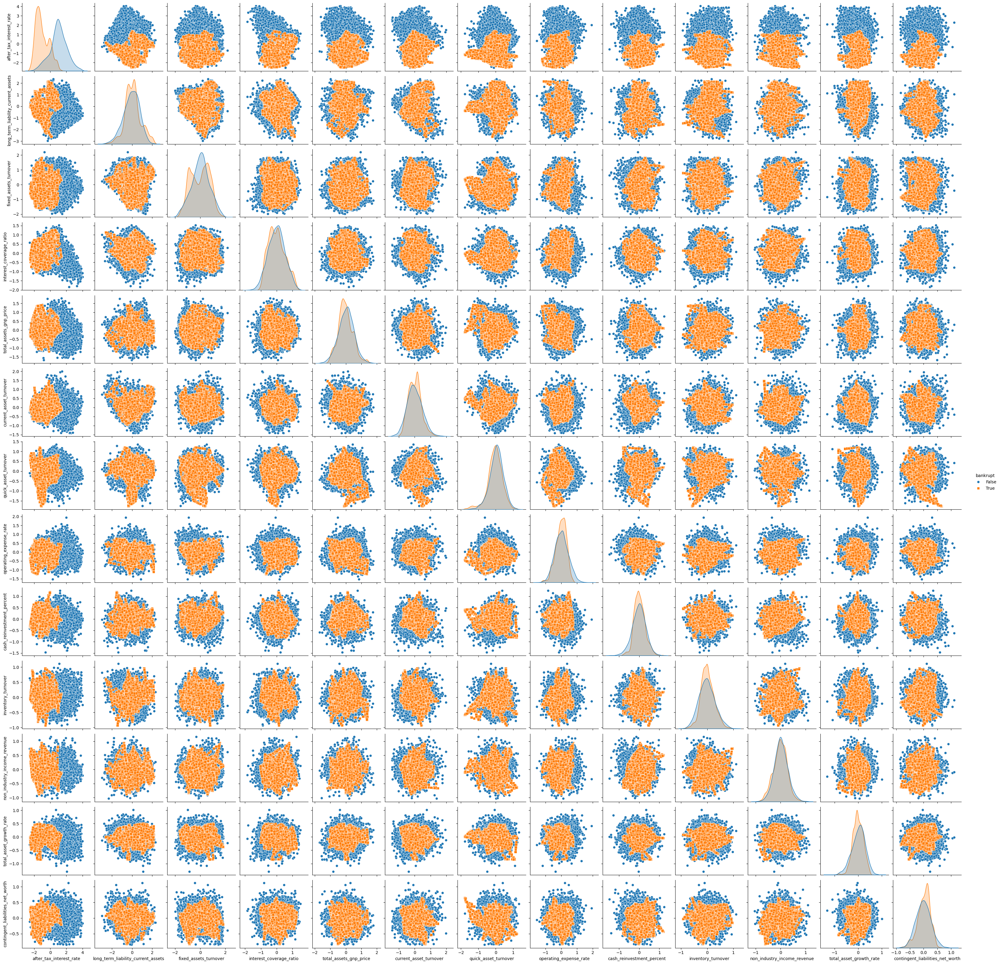

In [20]:
resampled_dataset = X_resampled_pca_df.copy()
resampled_dataset['bankrupt'] = y_resampled

# Pair plot delle feature colorate per classe
sns.pairplot(resampled_dataset, hue="bankrupt", diag_kind="kde", markers=["o", "s"])
plt.show()

Dal grafico si evince che il dataset **non** è linearmente separabile, scartando a priori l'utilizzo della _linear SVM_.
Dunque, abbiamo deciso di adottare un approccio basato sulla _rbf SVM_.

Fold 1
Accuracy per il Fold 1: 0.94
Fold 2
Accuracy per il Fold 2: 0.94
Fold 3
Accuracy per il Fold 3: 0.95
Fold 4
Accuracy per il Fold 4: 0.96
Fold 5
Accuracy per il Fold 5: 0.96
Fold 6
Accuracy per il Fold 6: 0.95
Fold 7
Accuracy per il Fold 7: 0.95
Fold 8
Accuracy per il Fold 8: 0.94
Fold 9
Accuracy per il Fold 9: 0.94
Fold 10
Accuracy per il Fold 10: 0.96

Accuracy sul test set: 0.94

Classification Report (Test Set):
              precision    recall  f1-score   support

       False       0.98      0.91      0.94      1068
        True       0.91      0.98      0.95      1047

    accuracy                           0.94      2115
   macro avg       0.95      0.95      0.94      2115
weighted avg       0.95      0.94      0.94      2115


Accuracy media sui fold della Cross Validation:
Media accuracy: 0.95


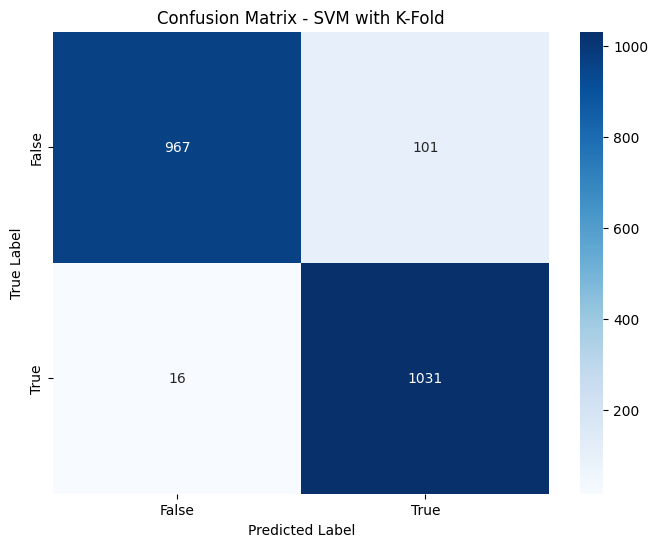

In [21]:
# Step 1: Divisione dei dati in training e test set (Holdout)
X_train, X_test, y_train, y_test = train_test_split(X_resampled_pca_df, y_resampled, test_size=0.2, random_state=42)

# Step 2: Configurazione del K-Fold Cross Validation
kf = KFold(n_splits=10, shuffle=True, random_state=42)
fold_accuracies = []

# Step 3: Applicazione del K-Fold sul training set
for fold, (train_idx, val_idx) in enumerate(kf.split(X_train)):
    print(f"Fold {fold + 1}")
    
    # Divisione dei dati in training e validation set
    X_train_fold, X_val_fold = X_train.iloc[train_idx], X_train.iloc[val_idx]
    y_train_fold, y_val_fold = y_train.iloc[train_idx], y_train.iloc[val_idx]
    
    # Inizializzazione del modello SVM con kernel RBF
    svm_model = SVC(
        kernel='rbf',
        random_state=42, 
        C=1.0,  # Parametro di regolarizzazione
        probability=True,  # Abilita la predizione delle probabilità
        # gamma='scale'  # Coefficiente del kernel RBF
    )
    
    # Addestramento del modello sui dati di training del fold
    svm_model.fit(X_train_fold, y_train_fold)
    
    # Predizione sul validation set
    y_val_pred = svm_model.predict(X_val_fold)
    
    # Calcolo dell'accuracy per il validation set
    fold_accuracy = accuracy_score(y_val_fold, y_val_pred)
    fold_accuracies.append(fold_accuracy)
    
    print(f"Accuracy per il Fold {fold + 1}: {fold_accuracy:.2f}")

# Step 4: Valutazione del modello sul test set
svm_model.fit(X_train, y_train)

y_test_pred = svm_model.predict(X_test)

# Calcolo delle metriche sul test set
test_accuracy = accuracy_score(y_test, y_test_pred)
print(f"\nAccuracy sul test set: {test_accuracy:.2f}")

print("\nClassification Report (Test Set):")
print(classification_report(y_test, y_test_pred))

print("\nAccuracy media sui fold della Cross Validation:")
print(f"Media accuracy: {np.mean(fold_accuracies):.2f}")

# Confusion matrix
conf_matrix = confusion_matrix(y_test, y_test_pred)

plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix, annot=True, fmt="d", cmap="Blues", xticklabels=['False', 'True'], yticklabels=['False', 'True'])
plt.title("Confusion Matrix - SVM with K-Fold")
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.show()


#### Curva ROC

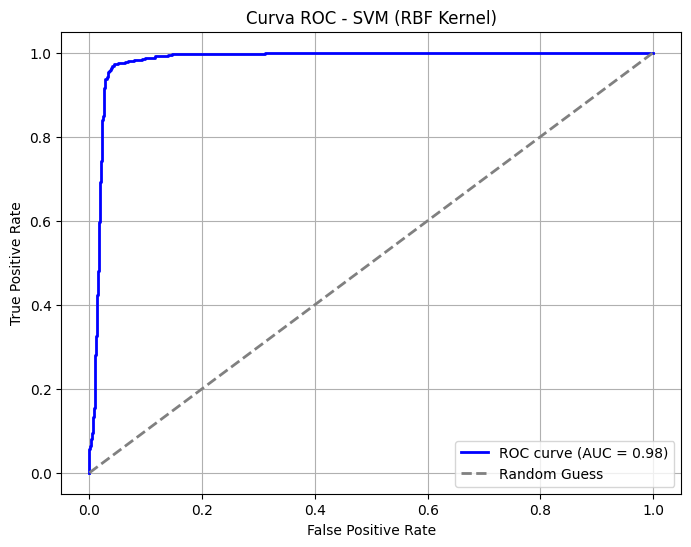

In [22]:
# Calcola le probabilità per la curva ROC
y_test_proba = svm_model.predict_proba(X_test)[:, 1]  # Probabilità della classe positiva

# Calcolo di FPR (False Positive Rate), TPR (True Positive Rate) e soglie
fpr, tpr, thresholds = roc_curve(y_test, y_test_proba)
roc_auc = auc(fpr, tpr)

# Disegna la curva ROC
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, color='blue', lw=2, label=f"ROC curve (AUC = {roc_auc:.2f})")
plt.plot([0, 1], [0, 1], color='gray', linestyle='--', lw=2, label="Random Guess")
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("Curva ROC - SVM (RBF Kernel)")
plt.legend(loc="lower right")
plt.grid()
plt.show()

# Classificazione: rbf SVM (Holdout + K-fold Cross Validation) con Grid Search

Fitting 10 folds for each of 15 candidates, totalling 150 fits
Migliori parametri trovati:
{'C': 10, 'gamma': 'scale', 'kernel': 'rbf'}

Accuracy sul test set: 0.98

Classification Report (Test Set):
              precision    recall  f1-score   support

       False       1.00      0.96      0.98      1068
        True       0.96      1.00      0.98      1047

    accuracy                           0.98      2115
   macro avg       0.98      0.98      0.98      2115
weighted avg       0.98      0.98      0.98      2115



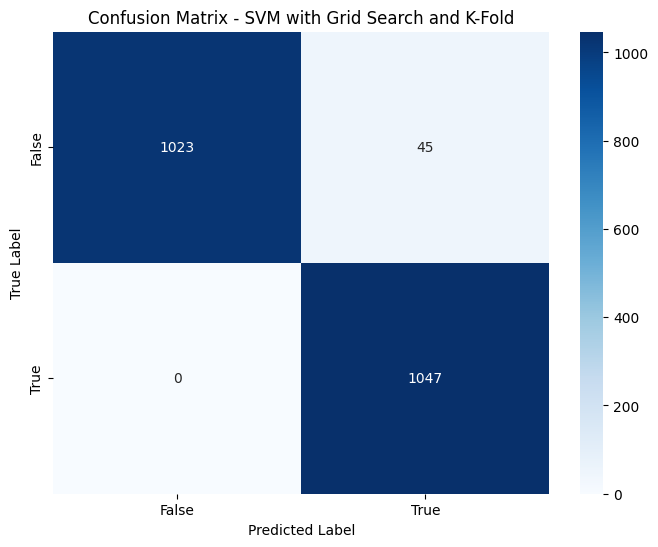

In [8]:
# Step 1: Divisione del dataset in training e test set
X_train, X_test, y_train, y_test = train_test_split(X_resampled_pca_df, y_resampled, test_size=0.2, random_state=42)

# Step 2: Configurazione dei parametri per la Grid Search
param_grid = {
    'C': [0.1, 1, 10],  # Parametro di regolarizzazione
    'gamma': ['scale', 'auto', 0.1, 0.01, 0.001],  # Coefficiente per il kernel RBF
    'kernel': ['rbf'],  # Tipo di kernel (fissato a RBF in questo caso)
}

# Step 3: Configurazione del K-Fold Cross Validation
kf = KFold(n_splits=10, shuffle=True, random_state=42)

# Step 4: Configurazione del GridSearchCV con K-Fold
grid_search = GridSearchCV(
    estimator=SVC(random_state=42, probability=True),
    param_grid=param_grid,
    scoring='accuracy',
    cv=kf,
    verbose=1,
    n_jobs=-1
)

# Step 5: Esecuzione della Grid Search sul training set
grid_search.fit(X_train, y_train)

# Step 6: Ottieni il miglior modello dai risultati della Grid Search
best_model = grid_search.best_estimator_
print(f"Migliori parametri trovati:\n{grid_search.best_params_}")

# Step 7: Valutazione del miglior modello sul test set
y_test_pred = best_model.predict(X_test)

# Calcolo dell'accuracy sul test set
test_accuracy = accuracy_score(y_test, y_test_pred)
print(f"\nAccuracy sul test set: {test_accuracy:.2f}")

# Classification report
print("\nClassification Report (Test Set):")
print(classification_report(y_test, y_test_pred))

# Confusion matrix
conf_matrix = confusion_matrix(y_test, y_test_pred)

plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix, annot=True, fmt="d", cmap="Blues", xticklabels=['False', 'True'], yticklabels=['False', 'True'])
plt.title("Confusion Matrix - SVM with Grid Search and K-Fold")
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.show()

#### Curva ROC

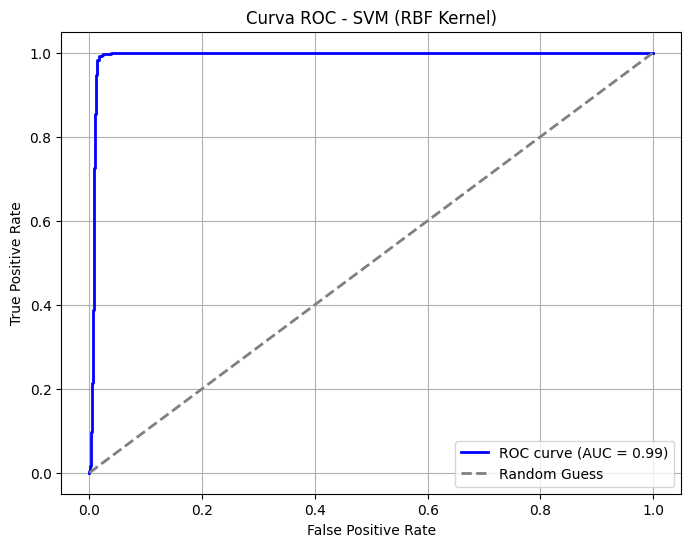

In [10]:
# Calcola le probabilità per la curva ROC
y_test_proba = best_model.predict_proba(X_test)[:, 1]  # Probabilità della classe positiva

# Calcolo di FPR (False Positive Rate), TPR (True Positive Rate) e soglie
fpr, tpr, thresholds = roc_curve(y_test, y_test_proba)
roc_auc = auc(fpr, tpr)

# Disegna la curva ROC
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, color='blue', lw=2, label=f"ROC curve (AUC = {roc_auc:.2f})")
plt.plot([0, 1], [0, 1], color='gray', linestyle='--', lw=2, label="Random Guess")
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("Curva ROC - SVM (RBF Kernel)")
plt.legend(loc="lower right")
plt.grid()
plt.show()

# Classificazione: XGBoost con Holdout e K-Fold Cross Validation

Fold 1
Accuracy per il Fold 1: 0.97
Fold 2
Accuracy per il Fold 2: 0.98
Fold 3
Accuracy per il Fold 3: 0.98
Fold 4
Accuracy per il Fold 4: 0.98
Fold 5
Accuracy per il Fold 5: 0.98
Fold 6
Accuracy per il Fold 6: 0.98
Fold 7
Accuracy per il Fold 7: 0.97
Fold 8
Accuracy per il Fold 8: 0.97
Fold 9
Accuracy per il Fold 9: 0.97
Fold 10
Accuracy per il Fold 10: 0.98

Accuracy sul test set: 0.97

Classification Report (Test Set):
              precision    recall  f1-score   support

       False       1.00      0.95      0.97      1068
        True       0.95      1.00      0.97      1047

    accuracy                           0.97      2115
   macro avg       0.97      0.97      0.97      2115
weighted avg       0.97      0.97      0.97      2115


Accuracy media sui fold della Cross Validation:
Media accuracy: 0.97


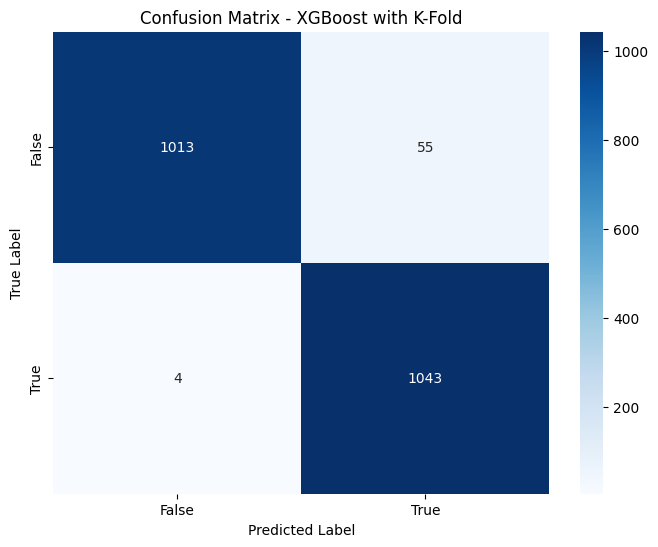

In [11]:
# Step 1: Divisione dei dati in training e test set (Holdout)
X_train, X_test, y_train, y_test = train_test_split(X_resampled_pca_df, y_resampled, test_size=0.2, random_state=42)

# Step 2: Configurazione del K-Fold Cross Validation
kf = KFold(n_splits=10, shuffle=True, random_state=42)
fold_accuracies = []

# Step 3: Applicazione del K-Fold sul training set
for fold, (train_idx, val_idx) in enumerate(kf.split(X_train)):
    print(f"Fold {fold + 1}")
    
    # Divisione dei dati in training e validation set
    X_train_fold, X_val_fold = X_train.iloc[train_idx], X_train.iloc[val_idx]
    y_train_fold, y_val_fold = y_train.iloc[train_idx], y_train.iloc[val_idx]
    
    # Inizializzazione del modello XGBoost
    xgb_model = XGBClassifier(
        learning_rate=0.1,          # Tasso di apprendimento
        max_depth=10,               # Profondità massima degli alberi
        n_estimators=100,           # Numero di alberi
        subsample=0.8,              # Percentuale di campioni usati per ogni albero
        colsample_bytree=0.8,       # Percentuale di feature usate per ogni albero
        random_state=42,            # Seed per la riproducibilità
        use_label_encoder=False,    # Disabilita l'encoder per le etichette
        eval_metric='logloss'       # Valutazione del logaritmo della loss
    )
    
    # Addestramento del modello sui dati di training del fold
    xgb_model.fit(X_train_fold, y_train_fold)
    
    # Predizione sul validation set
    y_val_pred = xgb_model.predict(X_val_fold)
    
    # Calcolo dell'accuracy per il validation set
    fold_accuracy = accuracy_score(y_val_fold, y_val_pred)
    fold_accuracies.append(fold_accuracy)
    
    print(f"Accuracy per il Fold {fold + 1}: {fold_accuracy:.2f}")

# Step 4: Valutazione del modello sul test set
xgb_model.fit(X_train, y_train)

y_test_pred = xgb_model.predict(X_test)

# Calcolo delle metriche sul test set
test_accuracy = accuracy_score(y_test, y_test_pred)
print(f"\nAccuracy sul test set: {test_accuracy:.2f}")

print("\nClassification Report (Test Set):")
print(classification_report(y_test, y_test_pred))

print("\nAccuracy media sui fold della Cross Validation:")
print(f"Media accuracy: {np.mean(fold_accuracies):.2f}")

# Confusion Matrix
conf_matrix = confusion_matrix(y_test, y_test_pred)

plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix, annot=True, fmt="d", cmap="Blues", xticklabels=['False', 'True'], yticklabels=['False', 'True'])
plt.title("Confusion Matrix - XGBoost with K-Fold")
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.show()

#### Curva ROC

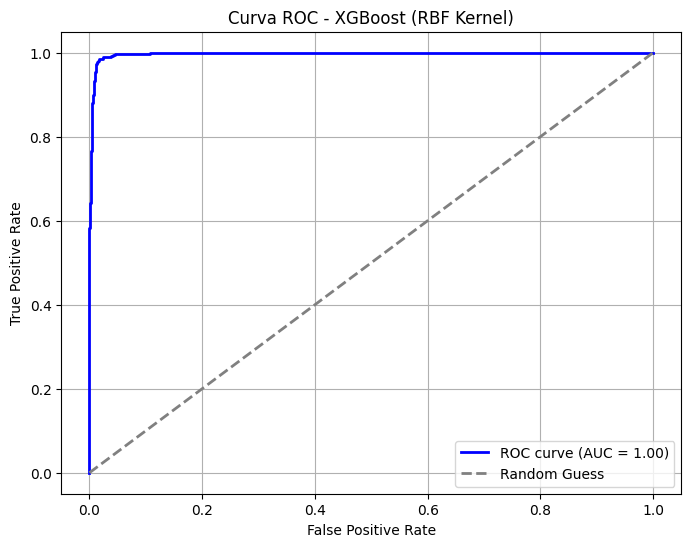

In [12]:
# Calcola le probabilità per la curva ROC
y_test_proba = xgb_model.predict_proba(X_test)[:, 1]  # Probabilità della classe positiva

# Calcolo di FPR (False Positive Rate), TPR (True Positive Rate) e soglie
fpr, tpr, thresholds = roc_curve(y_test, y_test_proba)
roc_auc = auc(fpr, tpr)

# Disegna la curva ROC
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, color='blue', lw=2, label=f"ROC curve (AUC = {roc_auc:.2f})")
plt.plot([0, 1], [0, 1], color='gray', linestyle='--', lw=2, label="Random Guess")
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("Curva ROC - XGBoost (RBF Kernel)")
plt.legend(loc="lower right")
plt.grid()
plt.show()

# Classificazione: XGBoost (Holdout e K-Fold Cross Validation) con Grid Search

Fitting 10 folds for each of 108 candidates, totalling 1080 fits
Migliori parametri trovati:
{'colsample_bytree': 1.0, 'learning_rate': 0.2, 'max_depth': 10, 'n_estimators': 150, 'subsample': 0.8}

Accuracy sul test set: 0.98

Classification Report (Test Set):
              precision    recall  f1-score   support

       False       0.99      0.96      0.98      1068
        True       0.96      0.99      0.98      1047

    accuracy                           0.98      2115
   macro avg       0.98      0.98      0.98      2115
weighted avg       0.98      0.98      0.98      2115



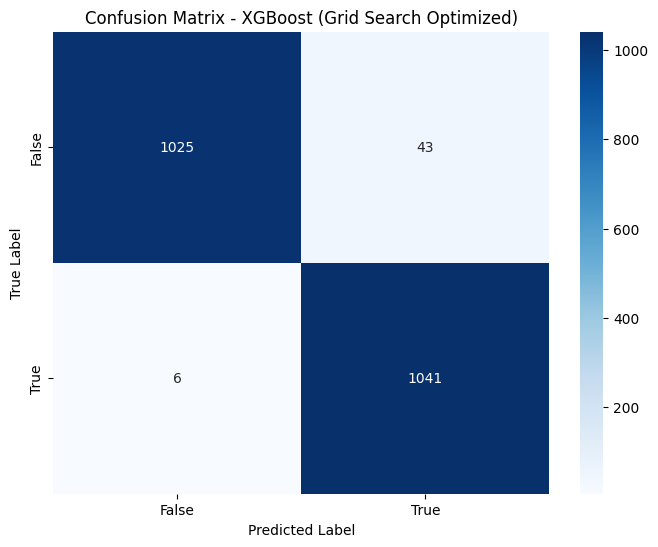


Risultati Cross Validation (Grid Search):
Accuracy: 0.9225 - Parametri: {'colsample_bytree': 0.8, 'learning_rate': 0.01, 'max_depth': 5, 'n_estimators': 50, 'subsample': 0.8}
Accuracy: 0.9207 - Parametri: {'colsample_bytree': 0.8, 'learning_rate': 0.01, 'max_depth': 5, 'n_estimators': 50, 'subsample': 1.0}
Accuracy: 0.9247 - Parametri: {'colsample_bytree': 0.8, 'learning_rate': 0.01, 'max_depth': 5, 'n_estimators': 100, 'subsample': 0.8}
Accuracy: 0.9250 - Parametri: {'colsample_bytree': 0.8, 'learning_rate': 0.01, 'max_depth': 5, 'n_estimators': 100, 'subsample': 1.0}
Accuracy: 0.9288 - Parametri: {'colsample_bytree': 0.8, 'learning_rate': 0.01, 'max_depth': 5, 'n_estimators': 150, 'subsample': 0.8}
Accuracy: 0.9296 - Parametri: {'colsample_bytree': 0.8, 'learning_rate': 0.01, 'max_depth': 5, 'n_estimators': 150, 'subsample': 1.0}
Accuracy: 0.9554 - Parametri: {'colsample_bytree': 0.8, 'learning_rate': 0.01, 'max_depth': 10, 'n_estimators': 50, 'subsample': 0.8}
Accuracy: 0.9546 - Pa

In [13]:
from sklearn.model_selection import GridSearchCV
from xgboost import XGBClassifier
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# Step 1: Divisione dei dati in training e test set (Holdout)
X_train, X_test, y_train, y_test = train_test_split(X_resampled_pca_df, y_resampled, test_size=0.2, random_state=42)

# Step 2: Configurazione degli iperparametri per la Grid Search
param_grid = {
    'learning_rate': [0.01, 0.1, 0.2],  # Tassi di apprendimento
    'max_depth': [5, 10, 15],           # Profondità massima degli alberi
    'n_estimators': [50, 100, 150],     # Numero di alberi
    'subsample': [0.8, 1.0],            # Percentuale di campioni usati per ogni albero
    'colsample_bytree': [0.8, 1.0]      # Percentuale di feature usate per ogni albero
}

# Step 3: Configurazione del modello XGBoost
xgb_model = XGBClassifier(
    random_state=42,
    use_label_encoder=False,
    eval_metric='logloss'  # Valutazione del logaritmo della loss
)

# Step 4: Configurazione della Grid Search con K-Fold Cross Validation
grid_search = GridSearchCV(
    estimator=xgb_model,
    param_grid=param_grid,
    scoring='accuracy',  # Metriche di valutazione
    cv=10,               # K-Fold Cross Validation
    verbose=1,
    n_jobs=-1            # Usa tutti i processori disponibili
)

# Step 5: Esecuzione della Grid Search sul training set
grid_search.fit(X_train, y_train)

# Step 6: Ottieni il miglior modello e parametri dai risultati della Grid Search
best_xgb_model = grid_search.best_estimator_
print(f"Migliori parametri trovati:\n{grid_search.best_params_}")

# Step 7: Valutazione del modello ottimizzato sul test set
y_test_pred = best_xgb_model.predict(X_test)

# Calcolo delle metriche sul test set
test_accuracy = accuracy_score(y_test, y_test_pred)
print(f"\nAccuracy sul test set: {test_accuracy:.2f}")

print("\nClassification Report (Test Set):")
print(classification_report(y_test, y_test_pred))

# Confusion Matrix
conf_matrix = confusion_matrix(y_test, y_test_pred)

plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix, annot=True, fmt="d", cmap="Blues", xticklabels=['False', 'True'], yticklabels=['False', 'True'])
plt.title("Confusion Matrix - XGBoost (Grid Search Optimized)")
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.show()

# Step 8: Stampa dei risultati della Cross Validation nella Grid Search
cv_results = grid_search.cv_results_
mean_test_scores = cv_results['mean_test_score']
params = cv_results['params']

print("\nRisultati Cross Validation (Grid Search):")
for mean_score, param in zip(mean_test_scores, params):
    print(f"Accuracy: {mean_score:.4f} - Parametri: {param}")

#### Curva ROC

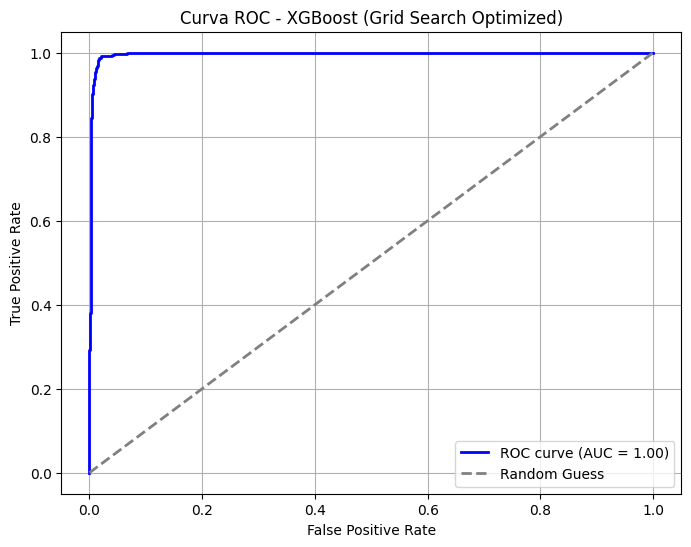

In [14]:
# Calcola le probabilità per la curva ROC
y_test_proba = best_xgb_model.predict_proba(X_test)[:, 1]  # Probabilità della classe positiva

# Calcolo di FPR (False Positive Rate), TPR (True Positive Rate) e soglie
fpr, tpr, thresholds = roc_curve(y_test, y_test_proba)
roc_auc = auc(fpr, tpr)

# Disegna la curva ROC
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, color='blue', lw=2, label=f"ROC curve (AUC = {roc_auc:.2f})")
plt.plot([0, 1], [0, 1], color='gray', linestyle='--', lw=2, label="Random Guess")
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("Curva ROC - XGBoost (Grid Search Optimized)")
plt.legend(loc="lower right")
plt.grid()
plt.show()

# Classificazione: Stacking Classifier con Holdout + K-fold Cross Validation

Fold 1
Accuracy per il Fold 1: 0.96
Fold 2
Accuracy per il Fold 2: 0.96
Fold 3
Accuracy per il Fold 3: 0.96
Fold 4
Accuracy per il Fold 4: 0.97
Fold 5
Accuracy per il Fold 5: 0.97
Fold 6
Accuracy per il Fold 6: 0.97
Fold 7
Accuracy per il Fold 7: 0.96
Fold 8
Accuracy per il Fold 8: 0.96
Fold 9
Accuracy per il Fold 9: 0.96
Fold 10
Accuracy per il Fold 10: 0.97

Accuracy sul test set: 0.96

Classification Report (Test Set):
              precision    recall  f1-score   support

       False       0.98      0.94      0.96      1068
        True       0.95      0.98      0.96      1047

    accuracy                           0.96      2115
   macro avg       0.96      0.96      0.96      2115
weighted avg       0.96      0.96      0.96      2115


Accuracy media sui fold della Cross Validation:
Media accuracy: 0.96


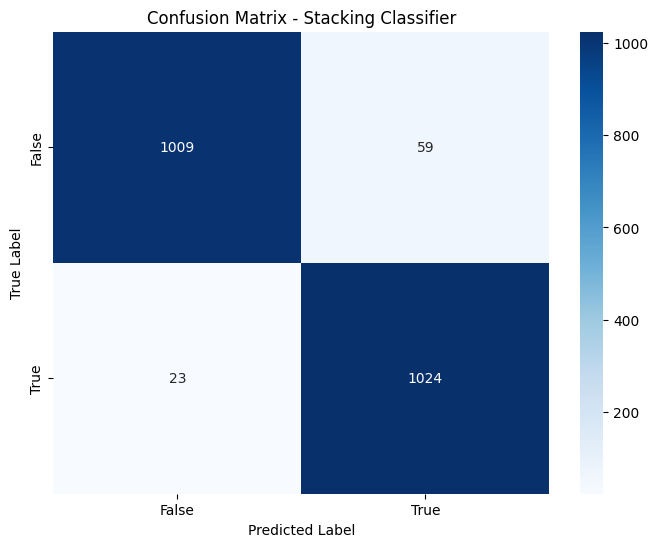

In [ ]:
# Step 1: Divisione dei dati in training e test set
X_train, X_test, y_train, y_test = train_test_split(X_resampled_pca_df, y_resampled, test_size=0.2, random_state=42)

# Step 2: Configurazione dei modelli base per lo Stacking
base_learners = [
    ('random_forest', RandomForestClassifier(
        n_estimators=200, max_depth=20, min_samples_leaf=20, random_state=42)),
    ('decision_tree', DecisionTreeClassifier(random_state=42)),
    ('svm', SVC(kernel='rbf', probability=True, random_state=42))
]

# Step 3: Definizione del meta-modello (livello superiore)
meta_model = LogisticRegression(max_iter=1000, random_state=42)

# Step 4: Configurazione del modello Stacking
stacking_clf = StackingClassifier(
    estimators=base_learners,
    final_estimator=meta_model,
    cv=10  # Cross Validation per evitare overfitting
)

# Step 5: Configurazione del K-Fold Cross Validation
kf = KFold(n_splits=10, shuffle=True, random_state=42)
fold_accuracies = []

# Applicazione del K-Fold Cross Validation
for fold, (train_idx, val_idx) in enumerate(kf.split(X_train)):
    print(f"Fold {fold + 1}")
    
    # Divizione dei dati in training e validation set
    X_train_fold, X_val_fold = X_train.iloc[train_idx], X_train.iloc[val_idx]
    y_train_fold, y_val_fold = y_train.iloc[train_idx], y_train.iloc[val_idx]
    
    # Addestramento del modello Stacking sui dati di training del fold
    stacking_clf.fit(X_train_fold, y_train_fold)
    
    # Predizione sul validation set
    y_val_pred = stacking_clf.predict(X_val_fold)
    
    # Calcolo dell'accuracy per il validation set
    fold_accuracy = accuracy_score(y_val_fold, y_val_pred)
    fold_accuracies.append(fold_accuracy)
    
    print(f"Accuracy per il Fold {fold + 1}: {fold_accuracy:.2f}")

# Step 6: Valutazione del modello sul test set
stacking_clf.fit(X_train, y_train)
y_test_pred = stacking_clf.predict(X_test)

test_accuracy = accuracy_score(y_test, y_test_pred)
print(f"\nAccuracy sul test set: {test_accuracy:.2f}")

print("\nClassification Report (Test Set):")
print(classification_report(y_test, y_test_pred))

print("\nAccuracy media sui fold della Cross Validation:")
print(f"Media accuracy: {np.mean(fold_accuracies):.2f}")

# Confusion matrix
conf_matrix = confusion_matrix(y_test, y_test_pred)

plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix, annot=True, fmt="d", cmap="Blues", xticklabels=['False', 'True'], yticklabels=['False', 'True'])
plt.title("Confusion Matrix - Stacking Classifier")
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.show()


#### Curva ROC

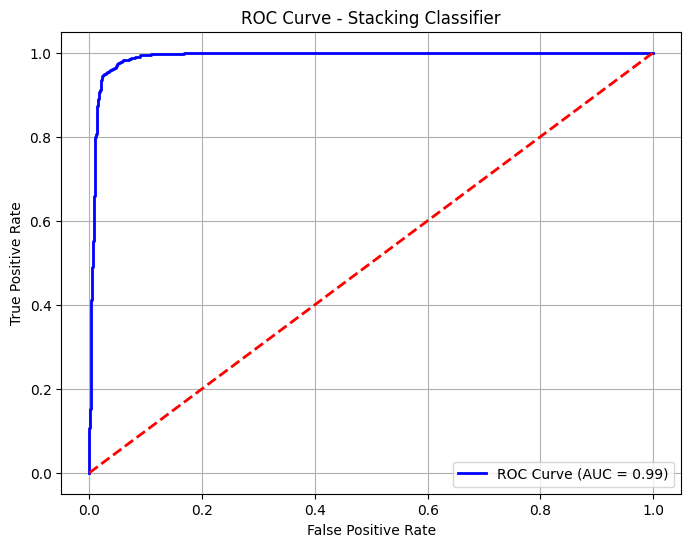

In [16]:
# Calcola le probabilità predette dal modello sul test set
y_test_proba = stacking_clf.predict_proba(X_test)[:, 1]  # Probabilità della classe positiva (True)

# Calcolo di FPR (False Positive Rate), TPR (True Positive Rate) e soglie
fpr, tpr, thresholds = roc_curve(y_test, y_test_proba)
roc_auc = auc(fpr, tpr)

# Disegna la curva ROC
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, color='blue', lw=2, label=f'ROC Curve (AUC = {roc_auc:.2f})')
plt.plot([0, 1], [0, 1], color='red', lw=2, linestyle='--')  # Linea di riferimento casuale
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve - Stacking Classifier')
plt.legend(loc="lower right")
plt.grid()
plt.show()

# Classificazione: Stacking Classifier con Holdout + K-fold Cross Validation e Grid Search

Fitting 10 folds for each of 72 candidates, totalling 720 fits
Migliori parametri trovati:
{'random_forest__max_depth': 10, 'random_forest__min_samples_leaf': 20, 'random_forest__n_estimators': 100, 'svm__C': 10, 'svm__gamma': 'scale'}

Accuracy sul test set: 0.99

Classification Report (Test Set):
              precision    recall  f1-score   support

       False       1.00      0.98      0.99      1068
        True       0.98      1.00      0.99      1047

    accuracy                           0.99      2115
   macro avg       0.99      0.99      0.99      2115
weighted avg       0.99      0.99      0.99      2115



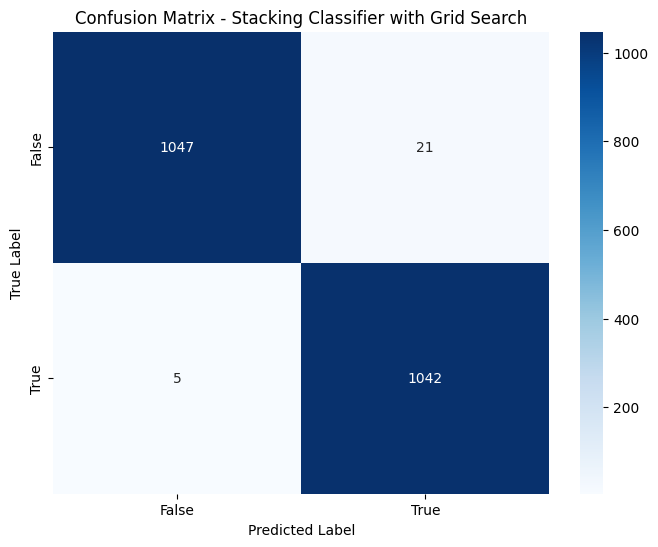

In [17]:
# Step 1: Divisione dei dati in training e test set
X_train, X_test, y_train, y_test = train_test_split(X_resampled_pca_df, y_resampled, test_size=0.2, random_state=42)

# Step 2: Configurazione dei modelli base per lo Stacking
base_learners = [
    ('random_forest', RandomForestClassifier(random_state=42)),
    ('decision_tree', DecisionTreeClassifier(random_state=42)),
    ('svm', SVC(kernel='rbf', probability=True, random_state=42))
]

# Step 3: Definizione del meta-modello
meta_model = LogisticRegression(max_iter=1000, random_state=42)

# Step 4: Configurazione del modello Stacking
stacking_clf = StackingClassifier(
    estimators=base_learners,
    final_estimator=meta_model,
    cv=5  # Cross Validation interna per lo stacking
)

# Step 5: Configurazione dei parametri per la Grid Search
param_grid = {
    'random_forest__n_estimators': [100, 200],  # Numero di alberi nel Random Forest
    'random_forest__max_depth': [10, 20],  # Profondità massima degli alberi
    'random_forest__min_samples_leaf': [10, 20],  # Numero minimo di campioni per foglia
    'svm__C': [0.1, 1, 10],  # Parametro di regolarizzazione SVM
    'svm__gamma': ['scale', 0.1, 0.01],  # Gamma per il kernel SVM
}

# Step 6: Configurazione della Grid Search con K-Fold
kf = KFold(n_splits=10, shuffle=True, random_state=42)

grid_search = GridSearchCV(
    estimator=stacking_clf,
    param_grid=param_grid,
    scoring='accuracy',  # Metrica da massimizzare
    cv=kf,
    verbose=1,
    n_jobs=-1  # Usa tutti i processori disponibili
)

# Step 7: Esecuzione della Grid Search sul training set
grid_search.fit(X_train, y_train)

# Step 8: Ottieni il miglior modello dai risultati della Grid Search
best_model = grid_search.best_estimator_
print(f"Migliori parametri trovati:\n{grid_search.best_params_}")

# Step 9: Valutazione del miglior modello sul test set
y_test_pred = best_model.predict(X_test)

test_accuracy = accuracy_score(y_test, y_test_pred)
print(f"\nAccuracy sul test set: {test_accuracy:.2f}")

print("\nClassification Report (Test Set):")
print(classification_report(y_test, y_test_pred))

# Confusion matrix
conf_matrix = confusion_matrix(y_test, y_test_pred)

plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix, annot=True, fmt="d", cmap="Blues", xticklabels=['False', 'True'], yticklabels=['False', 'True'])
plt.title("Confusion Matrix - Stacking Classifier with Grid Search")
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.show()

#### Curva ROC

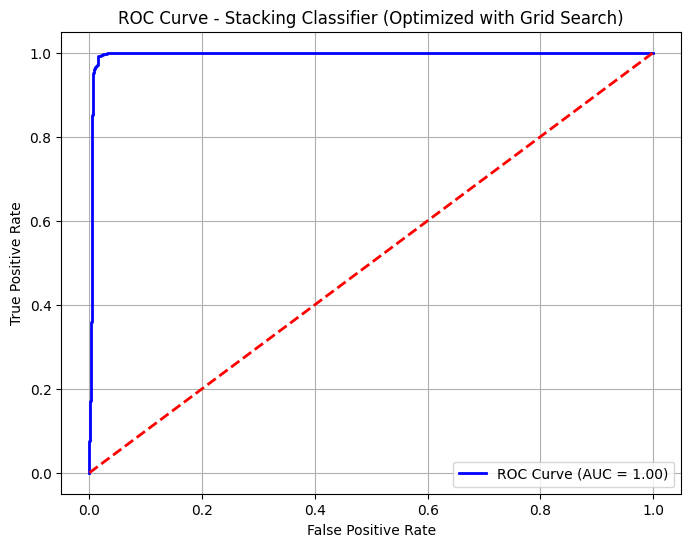

AUC Score: 0.9961


In [18]:
# Step 1: Calcola le probabilità predette dal miglior modello sul test set
y_test_proba = best_model.predict_proba(X_test)[:, 1]  # Probabilità della classe positiva (True)

# Calcolo di FPR (False Positive Rate), TPR (True Positive Rate) e soglie
fpr, tpr, thresholds = roc_curve(y_test, y_test_proba)
roc_auc = auc(fpr, tpr)

# Step 3: Disegna la curva ROC
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, color='blue', lw=2, label=f'ROC Curve (AUC = {roc_auc:.2f})')
plt.plot([0, 1], [0, 1], color='red', lw=2, linestyle='--')  # Linea di riferimento casuale
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve - Stacking Classifier (Optimized with Grid Search)')
plt.legend(loc="lower right")
plt.grid()
plt.show()

print(f"AUC Score: {roc_auc:.4f}")

# Classificazione: Logistic Regression (Holdout + K-Fold Cross Validation)
Scikit-learn supporta target booleani (False/True) 

Fold 1
Accuracy per il Fold 1: 0.86
Fold 2
Accuracy per il Fold 2: 0.87
Fold 3
Accuracy per il Fold 3: 0.89
Fold 4
Accuracy per il Fold 4: 0.88
Fold 5
Accuracy per il Fold 5: 0.88
Fold 6
Accuracy per il Fold 6: 0.88
Fold 7
Accuracy per il Fold 7: 0.88
Fold 8
Accuracy per il Fold 8: 0.88
Fold 9
Accuracy per il Fold 9: 0.89
Fold 10
Accuracy per il Fold 10: 0.88

Accuracy sul test set: 0.87

Classification Report (Test Set):
              precision    recall  f1-score   support

       False       0.89      0.84      0.86      1068
        True       0.84      0.89      0.87      1047

    accuracy                           0.87      2115
   macro avg       0.87      0.87      0.87      2115
weighted avg       0.87      0.87      0.87      2115


Accuracy media sui fold della Cross Validation:
Media accuracy: 0.88


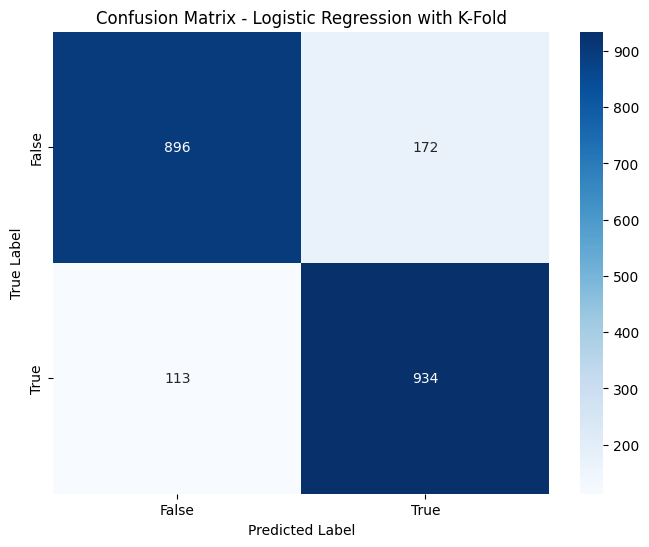

In [34]:
# Step 1: Divisione dei dati in training e test set (Holdout)
X_train, X_test, y_train, y_test = train_test_split(X_resampled_pca_df, y_resampled, test_size=0.2, random_state=42)

# Step 2: Configurazione del K-Fold Cross Validation
kf = KFold(n_splits=10, shuffle=True, random_state=42)
fold_accuracies = []

# Step 3: Applicazione del K-Fold sul training set
for fold, (train_idx, val_idx) in enumerate(kf.split(X_train)):
    print(f"Fold {fold + 1}")
    
    # Divisione dei dati in training e validation set
    X_train_fold, X_val_fold = X_train.iloc[train_idx], X_train.iloc[val_idx]
    y_train_fold, y_val_fold = y_train.iloc[train_idx], y_train.iloc[val_idx]
    
    # Inizializzazione del modello Logistic Regression
    log_reg_model = LogisticRegression(random_state=42, max_iter=1000)
    
    # Addestramento del modello sui dati di training del fold
    log_reg_model.fit(X_train_fold, y_train_fold)
    
    # Predizione sul validation set
    y_val_pred = log_reg_model.predict(X_val_fold)
    
    # Calcolo dell'accuracy per il validation set
    fold_accuracy = accuracy_score(y_val_fold, y_val_pred)
    fold_accuracies.append(fold_accuracy)
    
    print(f"Accuracy per il Fold {fold + 1}: {fold_accuracy:.2f}")

# Step 4: Valutazione del modello sul test set
log_reg_model.fit(X_train, y_train)

y_test_pred = log_reg_model.predict(X_test)

# Calcolo delle metriche sul test set
test_accuracy = accuracy_score(y_test, y_test_pred)
print(f"\nAccuracy sul test set: {test_accuracy:.2f}")

print("\nClassification Report (Test Set):")
print(classification_report(y_test, y_test_pred))

print("\nAccuracy media sui fold della Cross Validation:")
print(f"Media accuracy: {np.mean(fold_accuracies):.2f}")

# Confusion matrix
conf_matrix = confusion_matrix(y_test, y_test_pred)

plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix, annot=True, fmt="d", cmap="Blues", xticklabels=['False', 'True'], yticklabels=['False', 'True'])
plt.title("Confusion Matrix - Logistic Regression with K-Fold")
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.show()

#### Curva ROC

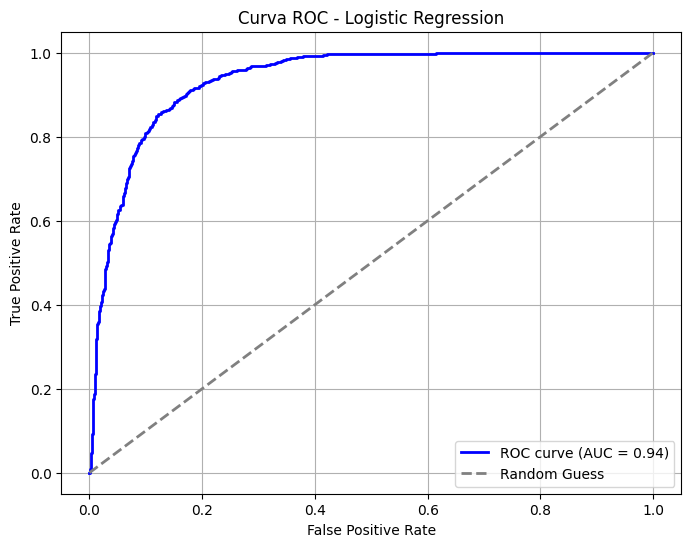

In [35]:
# Calcola le probabilità per la curva ROC
y_test_proba = log_reg_model.predict_proba(X_test)[:, 1]  # Probabilità della classe positiva

# Calcolo di FPR (False Positive Rate), TPR (True Positive Rate) e soglie
fpr, tpr, thresholds = roc_curve(y_test, y_test_proba)
roc_auc = auc(fpr, tpr)

# Disegna la curva ROC
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, color='blue', lw=2, label=f"ROC curve (AUC = {roc_auc:.2f})")
plt.plot([0, 1], [0, 1], color='gray', linestyle='--', lw=2, label="Random Guess")
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("Curva ROC - Logistic Regression")
plt.legend(loc="lower right")
plt.grid()
plt.show()

# Classificazione: Logistic Regression (Holdout + K-Fold Cross Validation) con Grid Search

Fitting 10 folds for each of 60 candidates, totalling 600 fits
Migliori parametri trovati:
{'C': 10, 'max_iter': 1000, 'penalty': 'l1', 'solver': 'liblinear'}

Accuracy sul test set: 0.86

Classification Report (Test Set):
              precision    recall  f1-score   support

       False       0.88      0.84      0.86      1068
        True       0.84      0.89      0.87      1047

    accuracy                           0.86      2115
   macro avg       0.86      0.86      0.86      2115
weighted avg       0.86      0.86      0.86      2115



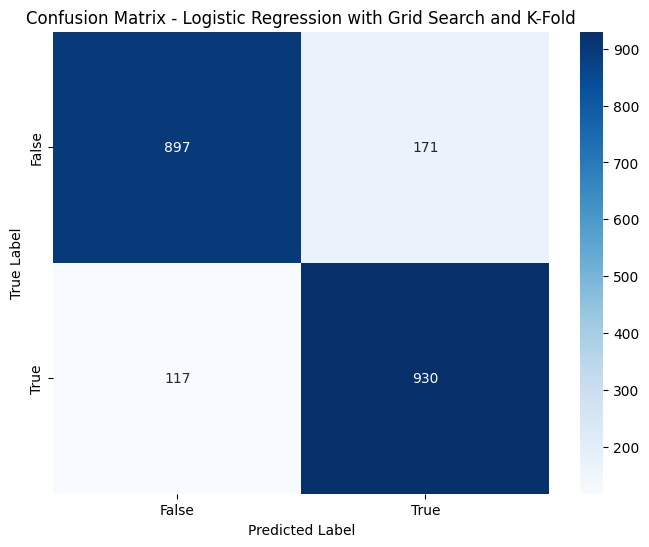

In [21]:
# Step 1: Divisione del dataset in training e test set
X_train, X_test, y_train, y_test = train_test_split(X_resampled_pca_df, y_resampled, test_size=0.2, random_state=42)

# Step 2: Configurazione dei parametri per la Grid Search
param_grid = {
    'penalty': ['l1', 'l2', 'elasticnet', None],  # Tipo di penalizzazione
    'C': [0.01, 0.1, 1, 10, 100],  # Inverso della forza di regolarizzazione
    'solver': ['lbfgs', 'liblinear', 'saga'],  # Algoritmi per l'ottimizzazione
    'max_iter': [1000]  # Numero massimo di iterazioni
}

# Step 3: Configurazione del K-Fold Cross Validation
kf = KFold(n_splits=10, shuffle=True, random_state=42)

# Step 4: Configurazione del GridSearchCV con K-Fold
grid_search = GridSearchCV(
    estimator=LogisticRegression(random_state=42),
    param_grid=param_grid,
    scoring='accuracy',
    cv=kf,
    verbose=1,
    n_jobs=-1
)

# Step 5: Esecuzione della Grid Search sul training set
grid_search.fit(X_train, y_train)

# Step 6: Ottieni il miglior modello dai risultati della Grid Search
best_model = grid_search.best_estimator_
print(f"Migliori parametri trovati:\n{grid_search.best_params_}")

# Step 7: Valutazione dell miglior modello sul test set
y_test_pred = best_model.predict(X_test)

# Calcolo dell'accuracy sul test set
test_accuracy = accuracy_score(y_test, y_test_pred)
print(f"\nAccuracy sul test set: {test_accuracy:.2f}")

# Classification report
print("\nClassification Report (Test Set):")
print(classification_report(y_test, y_test_pred))

# Cconfusion matrix
conf_matrix = confusion_matrix(y_test, y_test_pred)

plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix, annot=True, fmt="d", cmap="Blues", xticklabels=['False', 'True'], yticklabels=['False', 'True'])
plt.title("Confusion Matrix - Logistic Regression with Grid Search and K-Fold")
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.show()

#### Curva ROC

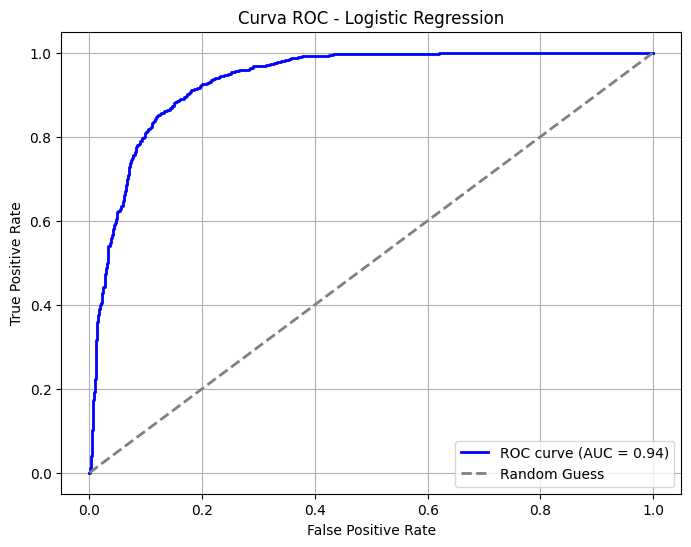

In [22]:
# Calcola le probabilità per la curva ROC
y_test_proba = log_reg_model.predict_proba(X_test)[:, 1]  # Probabilità della classe positiva

# Calcolo di FPR (False Positive Rate), TPR (True Positive Rate) e soglie
fpr, tpr, thresholds = roc_curve(y_test, y_test_proba)
roc_auc = auc(fpr, tpr)

# Disegna la curva ROC
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, color='blue', lw=2, label=f"ROC curve (AUC = {roc_auc:.2f})")
plt.plot([0, 1], [0, 1], color='gray', linestyle='--', lw=2, label="Random Guess")
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("Curva ROC - Logistic Regression")
plt.legend(loc="lower right")
plt.grid()
plt.show()

# Regressione: SVR (Support Vector Regression) con Holdout e K-Fold Cross Validation

In [23]:
# Step 1: Divisione del dataset in training e test set
X_train, X_test, y_train, y_test = train_test_split(X_resampled_pca_df, y_resampled, test_size=0.2, random_state=42)

# Step 2: Configurazione del K-Fold Cross Validation
kf = KFold(n_splits=10, shuffle=True, random_state=42)
fold_scores = []

# Step 3: Applicazione del K-Fold sul training set
for fold, (train_idx, val_idx) in enumerate(kf.split(X_train)):
    print(f"Fold {fold + 1}")
    
    # Divisione dei dati in training e validation set
    X_train_fold, X_val_fold = X_train.iloc[train_idx], X_train.iloc[val_idx]
    y_train_fold, y_val_fold = y_train.iloc[train_idx], y_train.iloc[val_idx]
    
    # Inizializzazione del modello SVR
    svr_model = SVR(kernel='rbf', C=1.0, epsilon=0.1)  # Kernel RBF con C=1.0 e epsilon=0.1
    
    # Addestramento del modello sui dati di training del fold
    svr_model.fit(X_train_fold, y_train_fold)
    
    # Predizione sul validation set
    y_val_pred = svr_model.predict(X_val_fold)
    
    # Calcolo del Mean Squared Error (MSE) per il fold
    mse = mean_squared_error(y_val_fold, y_val_pred)
    fold_scores.append(mse)
    
    print(f"MSE per il Fold {fold + 1}: {mse:.4f}")

# Step 4: Valutazione del modello sul test set
svr_model.fit(X_train, y_train)

y_test_pred = svr_model.predict(X_test)

# Calcolo delle metriche di regressione sul test set
mse_test = mean_squared_error(y_test, y_test_pred)
mae_test = mean_absolute_error(y_test, y_test_pred)
r2_test = r2_score(y_test, y_test_pred)

print(f"\nMetriche sul test set:")
print(f"Mean Squared Error (MSE): {mse_test:.4f}")
print(f"Mean Absolute Error (MAE): {mae_test:.4f}")
print(f"R2 Score: {r2_test:.4f}")

# Step 5: Calcolo della media delle metriche sui fold della Cross Validation
mean_mse_cv = np.mean(fold_scores)
print(f"\nMSE medio sui fold della Cross Validation: {mean_mse_cv:.4f}")

Fold 1
MSE per il Fold 1: 0.0407
Fold 2
MSE per il Fold 2: 0.0378
Fold 3
MSE per il Fold 3: 0.0396
Fold 4
MSE per il Fold 4: 0.0271
Fold 5
MSE per il Fold 5: 0.0334
Fold 6
MSE per il Fold 6: 0.0384
Fold 7
MSE per il Fold 7: 0.0415
Fold 8
MSE per il Fold 8: 0.0391
Fold 9
MSE per il Fold 9: 0.0390
Fold 10
MSE per il Fold 10: 0.0308

Metriche sul test set:
Mean Squared Error (MSE): 0.0397
Mean Absolute Error (MAE): 0.1194
R2 Score: 0.8410

MSE medio sui fold della Cross Validation: 0.0367


#### Curva ROC

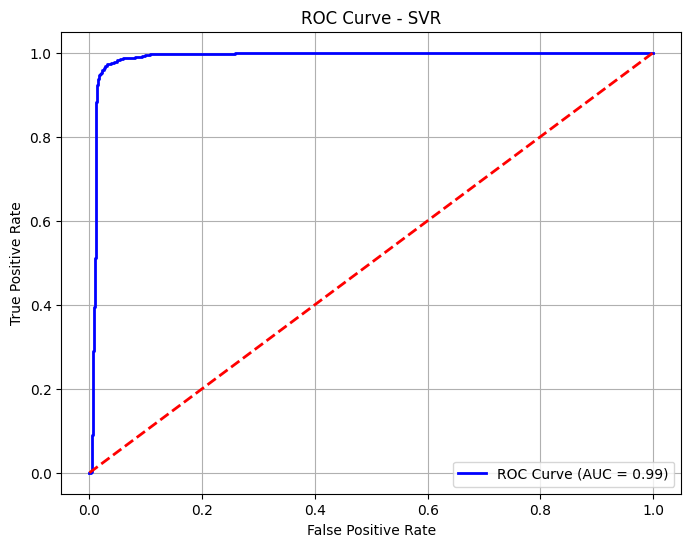

In [24]:
# Step 1: Predici i valori continui sul test set
y_test_pred_continuous = svr_model.predict(X_test)

# Calcolo di FPR (False Positive Rate), TPR (True Positive Rate) e soglie
fpr, tpr, thresholds = roc_curve(y_test, y_test_pred_continuous)
roc_auc = auc(fpr, tpr)

# Step 3: Disegna la curva ROC
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, color='blue', lw=2, label=f'ROC Curve (AUC = {roc_auc:.2f})')
plt.plot([0, 1], [0, 1], color='red', lw=2, linestyle='--')  # Linea di riferimento casuale
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve - SVR')
plt.legend(loc="lower right")
plt.grid()
plt.show()

# Rgressione: SVR (Support Vector Regression) con Holdout + K-Fold Cross Validation e Grid Search

In [ ]:
# Step 1: Divisione del dataset in training e test set
X_train, X_test, y_train, y_test = train_test_split(X_resampled_pca_df, y_resampled, test_size=0.2, random_state=42)

# Step 2: Configurazione dei parametri per la Grid Search
param_grid = {
    'C': [0.1, 1, 10],  # Parametro di regolarizzazione
    'epsilon': [0.01, 0.1, 0.5],  # Zona insensibile per l'errore
    'gamma': ['scale', 'auto', 0.1, 0.01]  # Coefficiente per il kernel RBF
}

# Step 3: Configurazione del K-Fold Cross Validation
kf = KFold(n_splits=10, shuffle=True, random_state=42)

# Step 4: Configurazione del GridSearchCV con K-Fold
grid_search = GridSearchCV(
    estimator=SVR(kernel='rbf'),
    param_grid=param_grid,
    scoring='neg_mean_squared_error',  # MSE negativo per convenzione
    cv=kf,
    verbose=1,
    n_jobs=-1
)

# Step 5: Esecuzione della Grid Search sul training set
grid_search.fit(X_train, y_train)

# Step 6: Ottieni il miglior modello dai risultati della Grid Search
best_model = grid_search.best_estimator_
print(f"Migliori parametri trovati:\n{grid_search.best_params_}")

# Step 7: Valutazione del miglior modello sul test set
y_test_pred = best_model.predict(X_test)

# Calcolo delle metriche di regressione sul test set
mse_test = mean_squared_error(y_test, y_test_pred)
mae_test = mean_absolute_error(y_test, y_test_pred)
r2_test = r2_score(y_test, y_test_pred)

print(f"\nMetriche sul test set:")
print(f"Mean Squared Error (MSE): {mse_test:.4f}")
print(f"Mean Absolute Error (MAE): {mae_test:.4f}")
print(f"R2 Score: {r2_test:.4f}")

# Step 8: Calcolo della media delle metriche sui fold della Cross Validation
mean_cv_score = -grid_search.best_score_  # Conversione del MSE negativo in positivo
print(f"\nMSE medio sui fold della Cross Validation: {mean_cv_score:.4f}")

Fitting 10 folds for each of 36 candidates, totalling 360 fits
Migliori parametri trovati:
{'C': 10, 'epsilon': 0.01, 'gamma': 'scale'}

Metriche sul test set:
Mean Squared Error (MSE): 0.0263
Mean Absolute Error (MAE): 0.0752
R2 Score: 0.8946

MSE medio sui fold della Cross Validation: 0.0260


#### Curva ROC

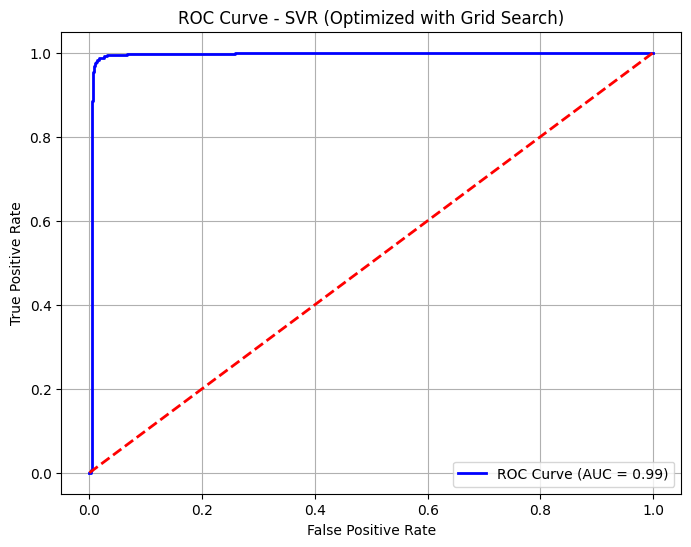

In [26]:
# Predizione dei valori continui sul test set
y_test_pred_continuous = best_model.predict(X_test)

# Calcolo di FPR (False Positive Rate), TPR (True Positive Rate) e soglie
fpr, tpr, thresholds = roc_curve(y_test, y_test_pred_continuous)
roc_auc = auc(fpr, tpr)

# Curva ROC
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, color='blue', lw=2, label=f'ROC Curve (AUC = {roc_auc:.2f})')
plt.plot([0, 1], [0, 1], color='red', lw=2, linestyle='--')  # Linea di riferimento casuale
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve - SVR (Optimized with Grid Search)')
plt.legend(loc="lower right")
plt.grid()
plt.show()

# Clustering
La prima fase, per l'esecuzione del K-Means, è quella della ricerca del numero di cluster ottimo da aspettarci in output, dato che un vincolo importante del K-Means è sapere a priori il numero di cluster da ottenere in output dall'algoritmi stesso.
I due metodo utilizzati sono:
- Metodo del gomito;
- Silhouette Score.

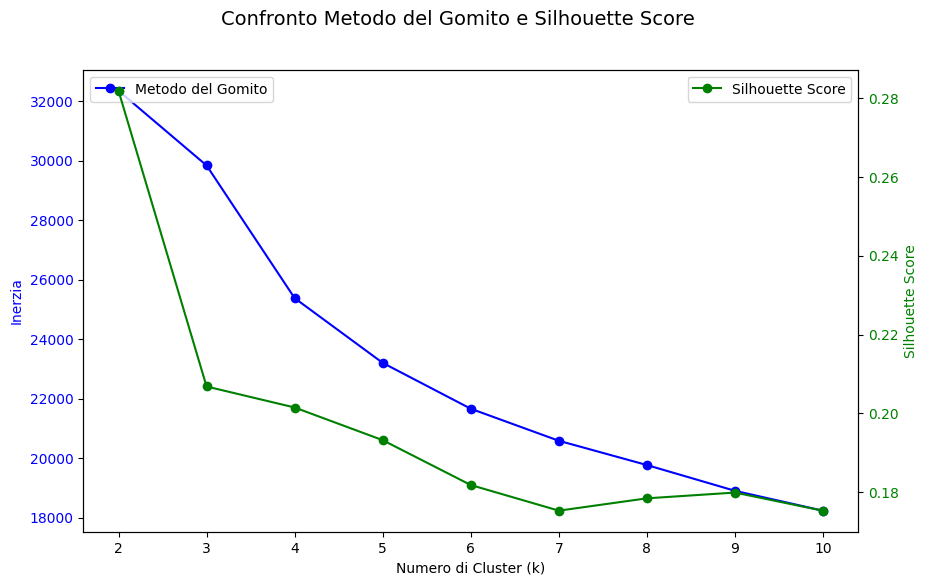

In [27]:
inertia = []  # Per il metodo del gomito
silhouette_scores = []  # Per il silhouette score

# Range del numero di cluster da testare
k_range = range(2, 11)  # Il metodo del gomito non ha senso per k=1

# Calcola i valori per ogni numero di cluster
for k in k_range:
    kmeans = KMeans(n_clusters=k, random_state=42)
    kmeans.fit(X_resampled_pca_df)  # Utilizza i dati standardizzati
    inertia.append(kmeans.inertia_)  # Inerzia per il metodo del gomito
    silhouette_scores.append(silhouette_score(X_resampled_pca_df, kmeans.labels_))  # Silhouette score

# Visualizza i risultati
fig, ax1 = plt.subplots(figsize=(10, 6))

# Grafico del metodo del gomito
ax1.plot(k_range, inertia, marker='o', label='Metodo del Gomito', color='blue')
ax1.set_xlabel('Numero di Cluster (k)')
ax1.set_ylabel('Inerzia', color='blue')
ax1.tick_params(axis='y', labelcolor='blue')

# Secondo asse per il silhouette score
ax2 = ax1.twinx()
ax2.plot(k_range, silhouette_scores, marker='o', label='Silhouette Score', color='green')
ax2.set_ylabel('Silhouette Score', color='green')
ax2.tick_params(axis='y', labelcolor='green')

# Titolo e legenda
fig.suptitle('Confronto Metodo del Gomito e Silhouette Score', fontsize=14)
ax1.legend(loc='upper left')
ax2.legend(loc='upper right')

# Mostra il grafico
plt.show()

In particolare:
1. Dal metodo del gomito (**linea blu**), si nota come il "_gomito_" stia intorno al valore <tt>`3`</tt>, indicando dunque il numero di cluster da scegliere pari a <tt>`3`</tt>.
2. Dal Silhouette Score, invece, il valore migliore di Silhouette corrisonde al valore <tt>`2`</tt>, indicando dunque il numero di cluster da scegliere pari a <tt>`2`</tt>.

La scelta del metodo deriva da due osservazioni:
- La nostra variabile target è binaria, forzando la scelta dei cluster da utilizzare pari a <tt>`2`</tt>.
- Tra i due metodi descritti, il più affidabile, quindi quello da scegliere, è la Silhouette Score poiché, rispetto al metodo del gomito che utilizza l'inerzia, offre una visione più bilanciata, incorporando sia **coesione** che **separazione** tra cluster.

## K-means

In [28]:
# Parametri
n_clusters = 2  # Numero di cluster
n_initializations = 10  # Numero di inizializzazioni casuali

# Lista per salvare SSE e modelli
sse_list = []
models = []

# Esegui K-means con diverse inizializzazioni
for i in range(n_initializations):
    kmeans = KMeans(n_clusters=n_clusters, init='random', n_init=1, random_state=i)
    kmeans.fit(X_resampled_pca_df)
    sse_list.append(kmeans.inertia_)
    models.append(kmeans)

# Trova l'inizializzazione con il valore di SSE più basso
best_index = np.argmin(sse_list)
best_kmeans = models[best_index]

print(f"Il valore minimo di SSE è {sse_list[best_index]} ottenuto con l'inizializzazione {best_index + 1}")

# Aggiungi le etichette dei cluster al dataset
X_resampled_pca_df_with_clusters = X_resampled_pca_df.copy()
X_resampled_pca_df_with_clusters['cluster'] = best_kmeans.labels_

# Visualizza i centri dei cluster
print("Centri dei cluster migliori:")
print(best_kmeans.cluster_centers_)


Il valore minimo di SSE è 32351.62808425303 ottenuto con l'inizializzazione 9
Centri dei cluster migliori:
[[-1.21001862e+00 -2.24562462e-01  6.22126008e-03 -1.29150476e-01
  -1.98795939e-02 -4.27534521e-02 -5.16698409e-02  5.70731530e-03
  -9.95966196e-04 -3.11884312e-03 -7.46698969e-03 -7.17553648e-03
   4.07149298e-03]
 [ 1.12221782e+00  2.08267866e-01 -5.76983592e-03  1.19779120e-01
   1.84371002e-02  3.96511962e-02  4.79205981e-02 -5.29318376e-03
   9.23697364e-04  2.89253509e-03  6.92517348e-03  6.65486857e-03
  -3.77605921e-03]]


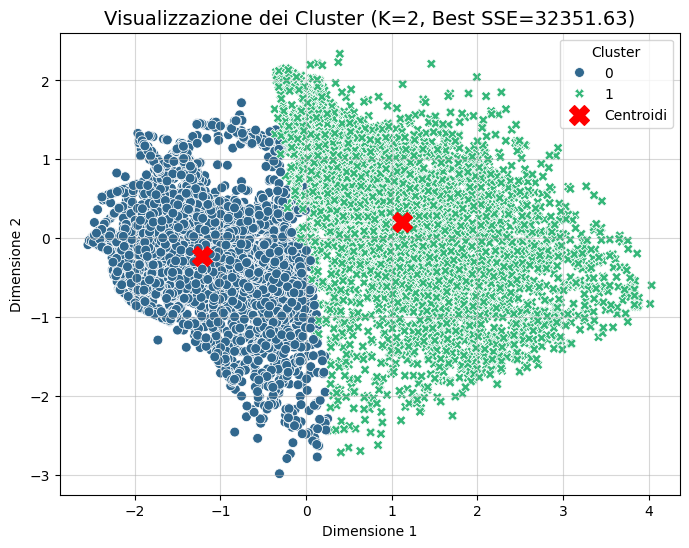

In [20]:
# Visualizza i cluster con un grafico scatter
plt.figure(figsize=(8, 6))
sns.scatterplot(
    x=X_resampled_pca_df_with_clusters.iloc[:, 0],  # Prima dimensione
    y=X_resampled_pca_df_with_clusters.iloc[:, 1],  # Seconda dimensione
    hue=X_resampled_pca_df_with_clusters['cluster'],  # Etichette dei cluster
    palette='viridis',
    style=X_resampled_pca_df_with_clusters['cluster'],
    s=50
)

# Evidenzia i centri dei cluster
centroids = best_kmeans.cluster_centers_
plt.scatter(
    centroids[:, 0], centroids[:, 1],
    c='red', marker='X', s=200, label='Centroidi'
)

# Titolo e legenda
plt.title(f'Visualizzazione dei Cluster (K={n_clusters}, Best SSE={sse_list[best_index]:.2f})', fontsize=14)
plt.xlabel('Dimensione 1')
plt.ylabel('Dimensione 2')
plt.legend(title='Cluster')
plt.grid(alpha=0.5)
plt.show()

## DBSCAN
Inizialmente, per il **minPts** (quindi il numero minimo di punti che deve essere presente all'interni di un cluster per essere considerato tale) è stato utilizzato un metodo euristico.
Per determinare l'**Eps**, invece, occorre tracciare il grafico delle distanze tra i punti del dataset in modo crescente.

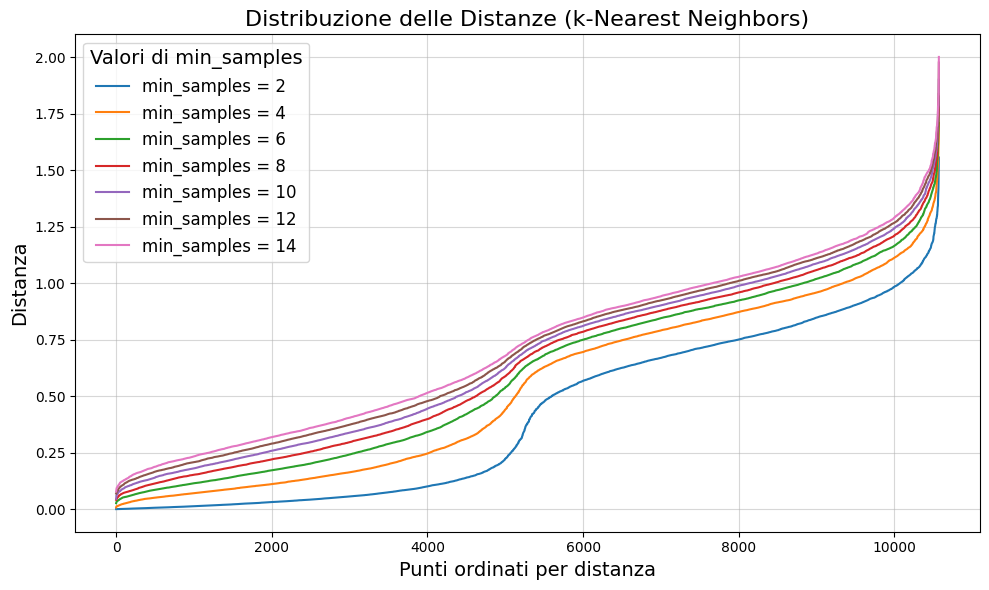

In [29]:
# Seleziona valori specifici di min_samples per rendere il grafico più chiaro
selected_min_samples = [2, 4, 6, 8, 10, 12, 14]

plt.figure(figsize=(10, 6))

# Calcolo e rappresentazione delle distanze
for min_samples in selected_min_samples:
    nearest_neighbors = NearestNeighbors(n_neighbors=min_samples)
    nearest_neighbors.fit(X_resampled_pca_df)
    distances, _ = nearest_neighbors.kneighbors(X_resampled_pca_df)
    
    # Ordina le distanze
    distances = np.sort(distances[:, -1])
    plt.plot(distances, label=f'min_samples = {min_samples}')

# Miglioramenti al grafico
plt.title('Distribuzione delle Distanze (k-Nearest Neighbors)', fontsize=16)
plt.xlabel('Punti ordinati per distanza', fontsize=14)
plt.ylabel('Distanza', fontsize=14)
plt.legend(title='Valori di min_samples', fontsize=12, title_fontsize=14)
plt.grid(alpha=0.5)
plt.tight_layout()

# Mostra il grafico
plt.show()

Dal grafico si nota come le scelte migliori siano:
- <tt>`min_samples`</tt> = 10;
- <tt>`min_samples`</tt> = 12.

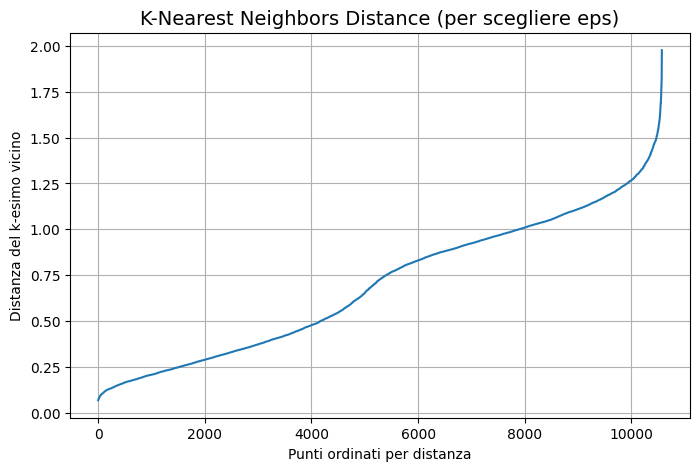

In [30]:
# Numero di vicini da considerare (uguale a min_samples)
min_samples = 12  # Cambia questo valore secondo la regola empirica

# Calcolo delle distanze dei k-nearest neighbors
nearest_neighbors = NearestNeighbors(n_neighbors=min_samples)
nearest_neighbors.fit(X_resampled_pca_df)
distances, indices = nearest_neighbors.kneighbors(X_resampled_pca_df)

# Ordina le distanze in ordine crescente
distances = np.sort(distances[:, -1])  # Prendi la distanza del k-esimo vicino
plt.figure(figsize=(8, 5))
plt.plot(distances)
plt.title('K-Nearest Neighbors Distance (per scegliere eps)', fontsize=14)
plt.xlabel('Punti ordinati per distanza')
plt.ylabel('Distanza del k-esimo vicino')
plt.grid()
plt.show()

Dal grafico si nota come il ginocchio della curva si trovi all'incirca nel valore di **Eps** pari a <tt>`1.25`</tt>.

In [32]:
# Parametri ottimali
eps = 1.25
min_samples = 10

# Applica DBSCAN
dbscan = DBSCAN(eps=eps, min_samples=min_samples)
dbscan_labels = dbscan.fit_predict(X_resampled_pca_df)

# Aggiungi le etichette dei cluster al dataset
X_resampled_pca_df['dbscan_cluster'] = dbscan_labels

# Conta il numero di cluster trovati (escludendo il rumore)
n_clusters = len(set(dbscan_labels)) - (1 if -1 in dbscan_labels else 0)
n_noise = list(dbscan_labels).count(-1)

print(f"Numero di cluster trovati: {n_clusters}")
print(f"Numero di punti rumore: {n_noise}")

Numero di cluster trovati: 1
Numero di punti rumore: 107


Numero di cluster concreti trovati (senza rumore): 1
Numero di punti considerati: 10465


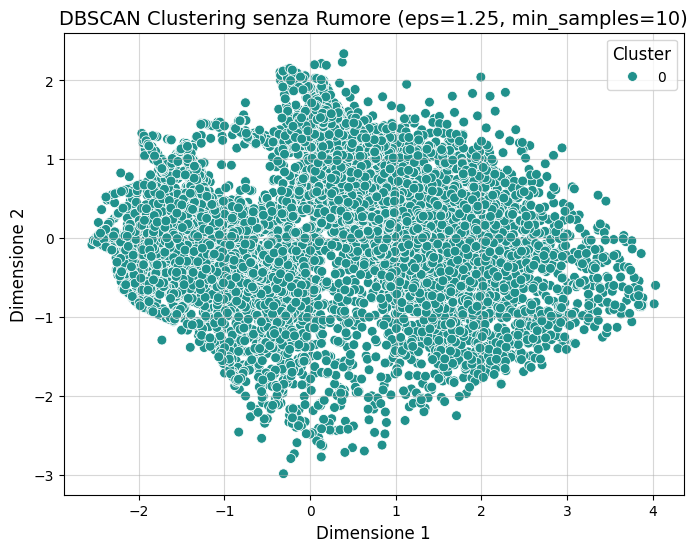

In [33]:
# Filtra i punti non rumore (escludendo il cluster -1)
filtered_data = X_resampled_pca_df[X_resampled_pca_df['dbscan_cluster'] != -1]

# Conta il numero di punti rimanenti e i cluster concreti
n_clusters_filtered = len(set(filtered_data['dbscan_cluster']))
print(f"Numero di cluster concreti trovati (senza rumore): {n_clusters_filtered}")
print(f"Numero di punti considerati: {len(filtered_data)}")

# Visualizza solo i cluster concreti
plt.figure(figsize=(8, 6))
sns.scatterplot(
    x=filtered_data.iloc[:, 0],  # Prima dimensione
    y=filtered_data.iloc[:, 1],  # Seconda dimensione
    hue=filtered_data['dbscan_cluster'],  # Etichette dei cluster
    palette='viridis',  # Colore diverso per ciascun cluster
    style=filtered_data['dbscan_cluster'],  # Stile dei punti
    s=50  # Dimensione dei punti
)

# Aggiungi titolo e asse
plt.title(f'DBSCAN Clustering senza Rumore (eps={eps}, min_samples={min_samples})', fontsize=14)
plt.xlabel('Dimensione 1', fontsize=12)
plt.ylabel('Dimensione 2', fontsize=12)
plt.legend(title='Cluster', fontsize=10, title_fontsize=12)
plt.grid(alpha=0.5)

# Mostra il grafico
plt.show()